In [1]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [2]:
import os
import shutil
from distutils.dir_util import copy_tree
import tarfile

from zipfile import ZipFile

### Генерация синтетического датасета с помощью **SynthText**

##### 1. Установка библиотек и клонирование репозитория **SynthText-Russian**

Воспользуемся адаптированной под русский язык библиотекой для генерации синтетического датасета `SynthText`

In [ ]:
os.chdir('/content/')
!git clone https://github.com/datanomica/SynthText-Russian

Cloning into 'SynthText-Russian'...
remote: Enumerating objects: 44, done.
remote: Counting objects: 100% (44/44), done.
remote: Compressing objects: 100% (41/41), done.
remote: Total 44 (delta 0), reused 0 (delta 0), pack-reused 0
Unpacking objects: 100% (44/44), 16.74 MiB | 5.33 MiB/s, done.


In [ ]:
!pip install -r /content/SynthText-Russian/requirements.txt

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 287.9/287.9 KB 12.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.3/3.3 MB 78.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.4/56.4 KB 8.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 481.8/481.8 KB 42.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.1/8.1 MB 72.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.6/11.6 MB 95.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.8/11.8 MB 95.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.8/11.8 MB 105.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.8/11.8 MB 29.0 MB/s eta 0:00:00
     ━━━━━━━━

##### 2. Подготовка данных, необходимых для генерации синтетического датасета

In [ ]:
# были внесены правки в invert_font_size.py, gen.py и text_utils.py поэтому заменяем исходные версии скриптов своими 
!cp -r '/content/gdrive/MyDrive/1_SynthText/Scripts/.' '/content/SynthText-Russian'

###### 2.1 Загрузим ранее скаченный [архив с картинками для фона](https://academictorrents.com/details/2dba9518166cbd141534cbf381aa3e99a087e83c) и распакуем его 

In [ ]:
os.chdir('/content/SynthText-Russian/')
copy_tree("/content/gdrive/MyDrive/googleFilesDownloader/73233acdf8d66574de57c5b17a01b223/SynthText/bg_data", "/content/SynthText-Russian/bg_data")

['/content/SynthText-Russian/bg_data/imnames.cp',
 '/content/SynthText-Russian/bg_data/depth.h5',
 '/content/SynthText-Russian/bg_data/bg_img.tar.gz',
 '/content/SynthText-Russian/bg_data/seg.h5',
 '/content/SynthText-Russian/bg_data/bg_img/ant+hill_129.jpg',
 '/content/SynthText-Russian/bg_data/bg_img/ant+hill_136.jpg',
 '/content/SynthText-Russian/bg_data/bg_img/ant+hill_74.jpg',
 '/content/SynthText-Russian/bg_data/bg_img/ant+hill_77.jpg',
 '/content/SynthText-Russian/bg_data/bg_img/ant+hill_95.jpg',
 '/content/SynthText-Russian/bg_data/bg_img/aquarium_107.jpg',
 '/content/SynthText-Russian/bg_data/bg_img/aquarium_12.jpg',
 '/content/SynthText-Russian/bg_data/bg_img/aquarium_125.jpg',
 '/content/SynthText-Russian/bg_data/bg_img/aquarium_148.jpg',
 '/content/SynthText-Russian/bg_data/bg_img/aquarium_37.jpg',
 '/content/SynthText-Russian/bg_data/bg_img/aquarium_63.jpg',
 '/content/SynthText-Russian/bg_data/bg_img/aquarium_69.jpg',
 '/content/SynthText-Russian/bg_data/bg_img/aquarium_8

In [ ]:
file = tarfile.open('/content/SynthText-Russian/bg_data/bg_img.tar.gz')
file.extractall('/content/SynthText-Russian/bg_data')
file.close()

In [ ]:
!rm -r '/content/SynthText-Russian/bg_data/bg_img.tar.gz'

###### 2.2 Добавим дополнительные шрифты и обновим их перечень в файле `fontlist.txt`


In [ ]:
!cp -r '/content/gdrive/MyDrive/1_SynthText/Fonts/.' '/content/SynthText-Russian/data/fonts/vn'

In [ ]:
path = "/content/SynthText-Russian/data/fonts/fontlist.txt"

with open(path, 'wb'):
    pass

os.system('ls /content/SynthText-Russian/data/fonts/vn/ >> "/content/SynthText-Russian/data/fonts/fontlist.txt"')

with open(path, 'r') as file:
    new = []
    lines = file.readlines()
    for i in lines:
      new.append('vn/' + i)

with open(path, 'w') as f:
    f.writelines(new)

Запустим скрипт `invert_font_size.py`, чтобы обновить модель `font_px2pt.cp` с учетом новых шрифтов и перенесем полученную модель в директорию */content/SynthText-Russian/data/models*

In [ ]:
!cd /content/SynthText-Russian
!python invert_font_size.py

pygame 2.3.0 (SDL 2.24.2, Python 3.9.16)
Hello from the pygame community. https://www.pygame.org/contribute.html
ALSA lib confmisc.c:767:(parse_card) cannot find card '0'
ALSA lib conf.c:4732:(_snd_config_evaluate) function snd_func_card_driver returned error: No such file or directory
ALSA lib confmisc.c:392:(snd_func_concat) error evaluating strings
ALSA lib conf.c:4732:(_snd_config_evaluate) function snd_func_concat returned error: No such file or directory
ALSA lib confmisc.c:1246:(snd_func_refer) error evaluating name
ALSA lib conf.c:4732:(_snd_config_evaluate) function snd_func_refer returned error: No such file or directory
ALSA lib conf.c:5220:(snd_config_expand) Evaluate error: No such file or directory
ALSA lib pcm.c:2642:(snd_pcm_open_noupdate) Unknown PCM default
0
/content/SynthText-Russian/invert_font_size.py:31: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the fu

In [ ]:
!cp -r '/content/SynthText-Russian/font_px2pt.cp' '/content/SynthText-Russian/data/models'

###### 2.3 Загрузим словарь с нужными словами

In [ ]:
!cp -r '/content/gdrive/MyDrive/1_SynthText/new_data.txt' '/content/SynthText-Russian/data/newsgroup'

##### 3. Генерация синтетического датасета для дообучения модели распознавания **PaddleOCR**

In [ ]:
!mkdir '/content/SynthText-Russian/results'

In [ ]:
!cd /content/SynthText-Russian
!python /content/SynthText-Russian/gen.py

Выходные данные были обрезаны до нескольких последних строк (5000).
    ... text rendering attempt finished successfully
    ... text rendering attempt finished successfully
 ** instance # : 1
    ... try text rendering for %s regions 30
    ... text rendering attempt finished successfully
    ... text rendering attempt finished successfully
    ... text rendering attempt finished successfully
    ... text rendering attempt finished successfully
    ... text rendering attempt finished successfully
    ... text rendering attempt finished successfully
315 of 799
 ** instance # : 0
    ... try text rendering for %s regions 6
    ... text rendering attempt finished successfully
    ... text rendering attempt finished successfully
    ... text rendering attempt finished successfully
    ... text rendering attempt finished successfully
 ** instance # : 1
    ... try text rendering for %s regions 3
    ... text rendering attempt finished successfully
316 of 799
 ** instance # : 0
    ... try 

In [ ]:
shutil.copy("/content/SynthText-Russian/results/SynthText.h5", "/content/gdrive/MyDrive/1_SynthText/SynthText_fonts")

'/content/gdrive/MyDrive/1_SynthText/SynthText_fonts/SynthText.h5'

На этом этапе из файла SynthText.h5 извлекаем вырезанные слова с текстовой аннотацией для тренировки нейронной сети. 

In [ ]:
from __future__ import division
import os
import os.path as osp
import numpy as np
import matplotlib.pyplot as plt 
import h5py 
from common import *

from natsort import natsorted
import itertools
import cv2
import numpy as np
from matplotlib import pyplot as plt
import pandas as pd
import regex as re
import tqdm

In [ ]:
def prepare_text(text):
    '''general text preparation'''
    text = text.replace('\n', ' ').replace('\t', ' ')
    text = re.sub(r'\s+', ' ', text).strip()
    return text

In [ ]:
os.chdir('/content/SynthText-Russian')
db = h5py.File('results/SynthText.h5', 'r')

dsets = natsorted(db['data'].keys())
print ("total number of images : ", len(dsets))

total number of images :  1351


In [ ]:
!rm -r '/content/SynthText-Russian/scene_text_recognition/train_images'
!rm -r '/content/SynthText-Russian/scene_text_recognition/val_images'

rm: cannot remove '/content/SynthText-Russian/scene_text_recognition/train_images': No such file or directory
rm: cannot remove '/content/SynthText-Russian/scene_text_recognition/val_images': No such file or directory


In [ ]:
#создадим папки для разделения сгенерированных картинок на трейновую и валидационную выборку
os.makedirs(f'scene_text_recognition/train_images/', exist_ok=True)
os.makedirs(f'scene_text_recognition/val_images/', exist_ok=True)

In [ ]:
#рассчитаем размер трейновой и валидационный выборку
len_val_images = int(len(dsets) * 0.1)
len_train_images = len(dsets) - len_val_images

135

In [ ]:
#вырезаем слова из картинок для трейновой выборки

im_n = 0
im_name_label = []

for item in tqdm.tqdm_notebook(list(range(len(dsets)))[0:len_train_images]):
    
    k = dsets[item]
    
    rgb = db['data'][k][...]
    wordBB = db['data'][k].attrs['wordBB']
    txt = db['data'][k].attrs['txt']
    txt = [prepare_text(i.decode('utf-8')).split(' ') for i in txt]
    txt = list(itertools.chain(*txt))
    
    #print(txt)
    
    # plot the word-BB:
    for image_item, im_text in zip(range(wordBB.shape[-1]), txt):
        
        bb = wordBB[:,:,image_item]
        bb = np.c_[bb,bb[:,0]]

        img_cutted = rgb[int(min(bb[1])):int(max(bb[1])), int(min(bb[0])):int(max(bb[0]))]

        im_name = f'{im_n}.png'
        
        try:
            cv2.imwrite(f'scene_text_recognition/train_images/{im_name}', img_cutted, [cv2.IMWRITE_PNG_COMPRESSION, 0])
            im_name_label.append([im_name, im_text])
        except:
            print(OSError)
            im_n += 1
            continue
        #except:
        #    print('Error!')

        im_n += 1

<ipython-input-24-d19ce9a1b8f6>:6: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for item in tqdm.tqdm_notebook(list(range(len(dsets)))[0:len_train_images]):


  0%|          | 0/1216 [00:00<?, ?it/s]

<class 'OSError'>
<class 'OSError'>
<class 'OSError'>
<class 'OSError'>
<class 'OSError'>
<class 'OSError'>
<class 'OSError'>
<class 'OSError'>
<class 'OSError'>
<class 'OSError'>
<class 'OSError'>
<class 'OSError'>
<class 'OSError'>
<class 'OSError'>
<class 'OSError'>
<class 'OSError'>
<class 'OSError'>
<class 'OSError'>
<class 'OSError'>
<class 'OSError'>
<class 'OSError'>
<class 'OSError'>
<class 'OSError'>
<class 'OSError'>
<class 'OSError'>
<class 'OSError'>
<class 'OSError'>
<class 'OSError'>
<class 'OSError'>
<class 'OSError'>
<class 'OSError'>
<class 'OSError'>
<class 'OSError'>
<class 'OSError'>
<class 'OSError'>
<class 'OSError'>
<class 'OSError'>
<class 'OSError'>
<class 'OSError'>
<class 'OSError'>
<class 'OSError'>
<class 'OSError'>
<class 'OSError'>
<class 'OSError'>
<class 'OSError'>
<class 'OSError'>
<class 'OSError'>
<class 'OSError'>
<class 'OSError'>
<class 'OSError'>
<class 'OSError'>
<class 'OSError'>
<class 'OSError'>
<class 'OSError'>
<class 'OSError'>
<class 'OS

In [ ]:
columns = ['file_name','text']       
train_df = pd.DataFrame(im_name_label, columns=columns)
train_df

,file_name,text
0,0.png,сорбат;
1,1.png,"нота,"
2,2.png,детей)
3,3.png,курдюк
4,4.png,"ХЛОПЬЯ,"
...,...,...
6204,6297.png,возм.
6205,6298.png,"200,"
6206,6299.png,"пасс,"
6207,6300.png,(тв


In [ ]:
#вырезаем слова из картинок для валидационной выборки

im_n = 0
im_name_label = []

for item in tqdm.tqdm_notebook(list(range(len(dsets)))[len_train_images:]):
    
    k = dsets[item]
    
    rgb = db['data'][k][...]
    wordBB = db['data'][k].attrs['wordBB']
    txt = db['data'][k].attrs['txt']
    txt = [prepare_text(i.decode('utf-8')).split(' ') for i in txt]
    txt = list(itertools.chain(*txt))
    
    #print(txt)
    
    # plot the word-BB:
    for image_item, im_text in zip(range(wordBB.shape[-1]), txt):
        
        bb = wordBB[:,:,image_item]
        bb = np.c_[bb,bb[:,0]]

        img_cutted = rgb[int(min(bb[1])):int(max(bb[1])), int(min(bb[0])):int(max(bb[0]))]

        im_name = f'{im_n}.png'
        
        try:
            cv2.imwrite(f'scene_text_recognition/val_images/{im_name}', img_cutted, [cv2.IMWRITE_PNG_COMPRESSION, 0])
            im_name_label.append([im_name, im_text])
        except:
            print(OSError)
            im_n += 1
            continue
        #except:
        #    print('Error!')

        im_n += 1

<ipython-input-26-17e4e3f8f9f4>:6: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for item in tqdm.tqdm_notebook(list(range(len(dsets)))[len_train_images:]):


  0%|          | 0/135 [00:00<?, ?it/s]

<class 'OSError'>
<class 'OSError'>
<class 'OSError'>
<class 'OSError'>
<class 'OSError'>
<class 'OSError'>
<class 'OSError'>
<class 'OSError'>
<class 'OSError'>
<class 'OSError'>
<class 'OSError'>
<class 'OSError'>
<class 'OSError'>
<class 'OSError'>
<class 'OSError'>
<class 'OSError'>
<class 'OSError'>
<class 'OSError'>
<class 'OSError'>
<class 'OSError'>
<class 'OSError'>


In [ ]:
columns = ['file_name','text']       
val_df = pd.DataFrame(im_name_label, columns=columns)
val_df

,file_name,text
0,0.png,"63,"
1,1.png,"Бэби,"
2,2.png,"алиготе,"
3,3.png,245г
4,4.png,"Е955,"
...,...,...
674,694.png,"задней,"
675,695.png,"Сока,"
676,696.png,Хани)
677,697.png,Кур.


In [ ]:
#генерируем аннотационные файлы к трейновой и валидационной выборке
with open("scene_text_recognition/train.txt", "w", encoding='utf8') as fo:        
    for index in tqdm.tqdm_notebook(range(train_df.shape[0])):
        file_name = train_df.iloc[index][0]
        text = train_df.iloc[index][1]
        fo.write(file_name + '\t' + text + '\n')
        
with open("scene_text_recognition/val.txt", "w", encoding='utf8') as fo:        
    for index in tqdm.tqdm_notebook(range(val_df.shape[0])):
        file_name = val_df.iloc[index][0]
        text = val_df.iloc[index][1]
        fo.write(file_name + '\t' + text + '\n')

<ipython-input-28-92a8ac1b098c>:4: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for index in tqdm.tqdm_notebook(range(train_df.shape[0])):


  0%|          | 0/6209 [00:00<?, ?it/s]

<ipython-input-28-92a8ac1b098c>:10: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for index in tqdm.tqdm_notebook(range(val_df.shape[0])):


  0%|          | 0/679 [00:00<?, ?it/s]

In [ ]:
#архивируем полученные выборки и аннтоционные файлы для дальнешего обучения модели распознавания
os.chdir('/content/SynthText-Russian')
import shutil
shutil.make_archive('scene_text_recognition', 'zip', 'scene_text_recognition')

'/content/SynthText-Russian/scene_text_recognition.zip'

In [ ]:
!cp -r '/content/SynthText-Russian/scene_text_recognition.zip' '/content/gdrive/MyDrive/1_SynthText'

<ipython-input-32-07ee9c9445e7>:4: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for item in tqdm.tqdm_notebook(list(range(len(dsets)))[0:len_train_images]):


  0%|          | 0/941 [00:00<?, ?it/s]

[[[ 28.007902 173.51659    8.583865   8.010331  97.94853   99.182365]
  [ 74.24401  275.7574    22.945581  24.881268 235.65486  204.46135 ]
  [ 69.41756  272.28668   23.094337  25.0233   235.66496  204.47223 ]
  [ 23.181448 170.04588    8.73262    8.152363  97.95863   99.19325 ]]

 [[ 39.55968  317.19632   11.661002  43.992355 212.47714  241.40498 ]
  [ 49.079636 327.5156    11.580325  43.903152 212.3913   241.34666 ]
  [ 72.52054  361.90244   38.06061   70.765625 228.59784  261.01227 ]
  [ 63.000587 351.58316   38.14129   70.85483  228.68369  261.07062 ]]]
['(ПРИ', 'медовой,', 'Лед,', 'х8г,', 'аллюлоза.', 'валяние,']


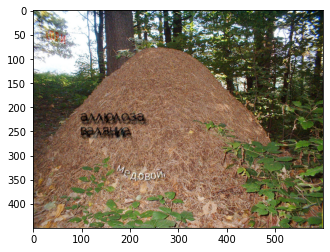

[[[ 33.747253  383.3923     12.160133  374.82257     1.4008075]
  [ 75.46462   474.7147     73.700836  494.91003    60.308323 ]
  [ 70.89373   476.6188     71.25391   496.97528    60.36986  ]
  [ 29.176361  385.29642     9.713203  376.88782     1.4623451]]

 [[ 36.230324   69.29661   159.59642    81.71495   133.26605  ]
  [ 43.583214   62.452297  165.26006    73.32968   133.10611  ]
  [ 69.516624   87.85891   191.84825   102.90651   155.77182  ]
  [ 62.163734   94.70322   186.18462   111.29178   155.93176  ]]]
['422', 'ваниль/', '(Венский', 'кокосовое', 'обработана,']


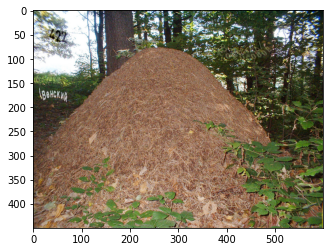

[[[144.60947 160.10248]
  [199.9404  223.21924]
  [210.3486  230.57062]
  [155.01767 167.45386]]

 [[467.77228 501.25693]
  [443.3603  485.37946]
  [466.951   514.6029 ]
  [491.36298 530.4804 ]]]
['Е-270,', '(гриль']


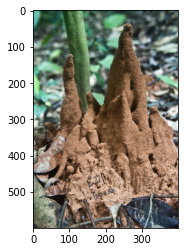

[[[310.80084  78.7726 ]
  [347.31128 113.13063]
  [354.3676  114.49037]
  [317.85718  80.13234]]

 [[265.9281  160.47266]
  [247.63716 157.32736]
  [261.72223 172.18066]
  [280.01318 175.32596]]]
['163,', 'В3)']


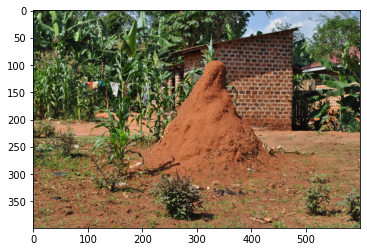

[[[ 72.53027  288.91483   76.87609  104.25538  267.03555 ]
  [116.15735  362.57333  153.30197  130.96835  284.31924 ]
  [117.84505  369.83725  153.37302  131.05402  286.5366  ]
  [ 74.21797  296.17874   76.94714  104.34105  269.2529  ]]

 [[132.5673   301.34677   48.00631   68.372536  43.52574 ]
  [128.91524  259.9678    47.725685  68.24528   41.52739 ]
  [149.07622  272.8983    67.07818   86.22842   60.70491 ]
  [152.72829  314.27725   67.3588    86.355675  62.703262]]]
['е422', 'ГМО.', 'Брусник,', 'В9,', '86;']


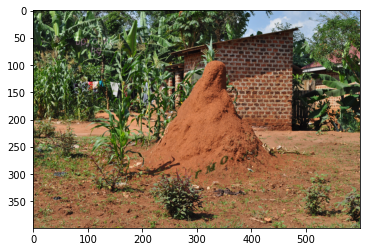

[[[355.0922    223.0985    354.2443    386.36954   378.15048
   377.168     259.48004  ]
  [403.8422    349.5562    364.40097   479.06693   511.04318
   452.23862   329.02948  ]
  [426.65976   348.2871    375.5889    479.62668   511.20572
   452.3561    329.21368  ]
  [377.90976   221.82939   365.43222   386.9293    378.31302
   377.2855    259.66425  ]]

 [[ 32.04289   412.5837     56.761005  346.18756   378.5519
   412.51746   397.594    ]
  [ -4.6724253 418.6326     49.73565   342.84082   377.55527
   412.1242    396.97827  ]
  [ 25.624332  445.16428    65.91026   358.34448   399.22598
   434.55475   417.78912  ]
  [ 62.339645  439.1154     72.935616  361.69122   400.22263
   434.948     418.40485  ]]]
['лазурь).', 'Пикуаль', 'П/ф', 'часов', 'Десерт,', 'Е961,', 'кура.']


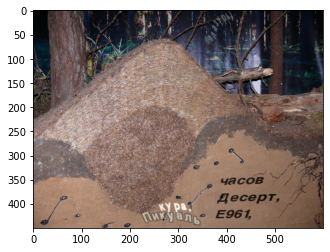

[[[290.41272    11.1064415 325.22293  ]
  [326.15845    71.43624   359.72684  ]
  [349.03418    71.85118   377.07858  ]
  [313.28845    11.521378  342.57468  ]]

 [[352.9254    286.4479    337.3415   ]
  [329.32147   285.38748   309.52374  ]
  [363.96442   308.99466   331.04608  ]
  [387.56836   310.05508   358.86383  ]]]
['950,', '236', 'Е131,']


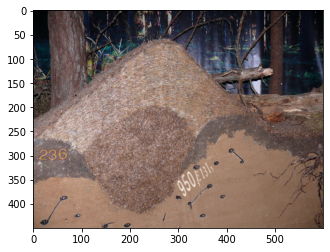

[[[124.69211 ]
  [171.85596 ]
  [163.90845 ]
  [116.7446  ]]

 [[ 39.90562 ]
  [ 63.41959 ]
  [ 79.360535]
  [ 55.84656 ]]]
['Пищ.']


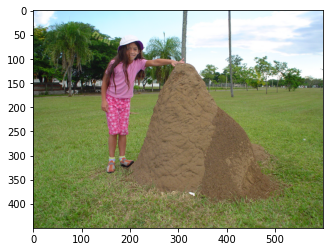

[[[161.49745     3.2794342]
  [291.97955    73.815575 ]
  [291.82074    75.7721   ]
  [161.33864     5.235962 ]]

 [[ 10.649633   55.343033 ]
  [ 11.429222   47.99092  ]
  [ 38.011055   66.76178  ]
  [ 37.231464   74.11389  ]]]
['ЙОГУРТ).', 'курк,']


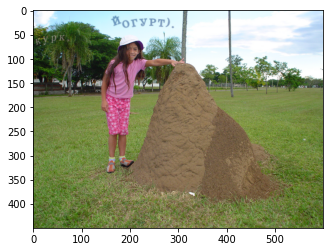

[[[245.70036  255.08661  264.24142  274.40186  283.03897  291.58224
   368.7039   385.5802  ]
  [336.69104  408.02692  350.06357  319.3482   396.3315   380.93448
   447.9039   444.7317  ]
  [333.81122  406.18732  348.4561   318.21454  395.36935  380.09842
   446.46414  443.93835 ]
  [242.82054  253.24701  262.63394  273.2682   282.0768   290.7462
   367.26413  384.78687 ]]

 [[ 86.154305 111.009    135.00787  161.64308  184.28484  203.47966
   206.01959  252.86325 ]
  [ 99.40244  125.28723  142.1626   164.88753  191.37703  207.6429
   210.39139  254.89117 ]
  [119.181755 144.99225  161.44449  180.593    206.74675  225.58632
   236.47473  278.032   ]
  [105.93362  130.71402  154.28976  177.34856  199.65456  221.42308
   232.10294  276.0041  ]]]
['(эмульсия', 'бифидобактериях,', '(коктейль', 'счет,', 'используется,', 'гамбургер).', 'Ж-31г.', 'ему,']


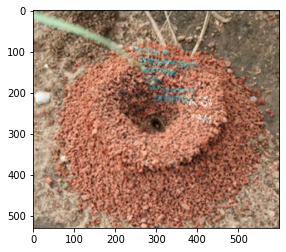

[[[470.3047   476.3984   476.66595  481.07593  260.4103   268.24094
   275.85645  281.9605  ]
  [595.6791   571.84033  582.3509   586.3639   407.38638  357.5248
   392.83813  382.0713  ]
  [591.03687  566.0099   577.8796   581.1124   405.77725  355.4205
   391.5586   380.76257 ]
  [465.66248  470.56796  472.19464  475.82446  258.80118  266.13663
   274.5769   280.6518  ]]

 [[ 11.237229  42.01544   79.03032  110.06474  124.02627  141.59763
   160.618    177.96664 ]
  [ 34.491974  64.280525  95.59152  131.34776  135.65858  150.65665
   168.10005  184.50589 ]
  [ 59.519592  89.27324  124.12541  157.32668  155.99045  171.39621
   188.10606  204.5416  ]
  [ 36.264847  67.008156 107.56421  136.04366  144.35814  162.33719
   180.62401  198.00235 ]]]
['жареным.', 'Сальса,', 'ригате).', 'солодки;', 'Ежевичный);', 'Камедь,', 'меньшую),', 'клюквы),']


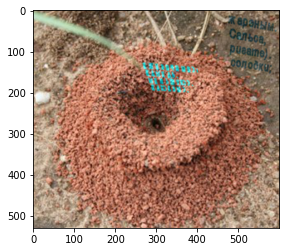

[[[163.77432  115.38015  336.98468  277.4119   308.87402  245.65732
   293.2307  ]
  [236.67401  173.10785  438.1056   447.07724  395.18536  429.77042
   393.48804 ]
  [237.0181   168.4737   435.33936  444.73026  393.01306  428.592
   388.53082 ]
  [164.11841  110.745995 334.21844  275.0649   306.70172  244.47891
   288.2735  ]]

 [[562.88434  261.94318  198.01521  233.1246   271.05154  318.2416
    86.26119 ]
  [561.92755  270.45148  207.98698  246.28256  275.85104  324.26553
   100.903206]
  [588.1451   301.89374  236.0385   276.5459   314.91605  360.28183
   134.84656 ]
  [589.10187  293.38544  226.06673  263.38794  310.11655  354.2579
   120.20455 ]]]
['Е421,', 'ЕС,', 'желток,', 'уплотнитель-', '(К481', 'вкуса/аромата;', 'плавленный,']


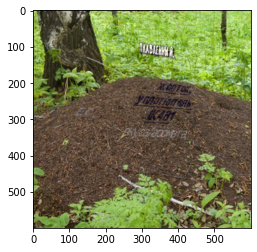

[[[334.48828  335.17993  182.1218   181.8472   203.15276 ]
  [416.97192  438.6599   275.5071   271.9906   255.03331 ]
  [413.61475  435.00012  276.19696  272.46033  255.16817 ]
  [331.1311   331.52014  182.81165  182.31693  203.28761 ]]

 [[ 13.851055  53.85078  528.7468   549.10834  572.0017  ]
  [ 26.729107  69.47619  524.5326   546.73553  571.59985 ]
  [ 48.23179   93.713425 539.8197   564.58026  589.01086 ]
  [ 35.353737  78.08802  544.03394  566.95306  589.4127  ]]]
['культур,', 'ТАБЛИЦЕ,', 'чеснок', 'кожей.', 'ФС.']


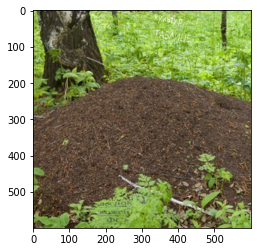

[[[304.12375  190.4445  ]
  [333.03775  358.75714 ]
  [331.72018  356.08087 ]
  [302.80618  187.76823 ]]

 [[ 15.707798 530.5994  ]
  [ 18.09531  546.2089  ]
  [ 34.052013 575.0666  ]
  [ 31.664501 559.4571  ]]]
['В9,', 'рассчитана']


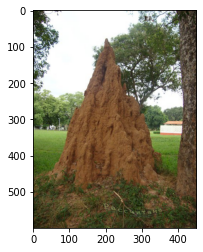

[[[247.46819  252.49933  258.48544  262.83752  267.54355   69.71246
    80.59412   60.01531   86.481384  82.16963 ]
  [375.04816  360.998    331.20682  379.65094  323.3165   135.15794
   103.63092  133.30737  118.042206 126.205414]
  [373.7083   360.08704  330.4019   379.18323  323.05972  135.36757
   103.892136 131.57301  118.44119  126.51749 ]
  [246.12834  251.58838  257.6805   262.3698   267.28677   69.92209
    80.85533   58.28095   86.88037   82.481705]]

 [[506.1146   524.1015   541.7486   561.0611   577.8855    71.82608
   101.17874  130.06099  159.4307   193.9703  ]
  [514.7768   529.1768   544.81635  564.33673  578.75867   71.071
   100.88129  135.70122  158.79935  192.83994 ]
  [534.51     548.6514   563.89667  581.0159   595.15845   89.239655
   121.111755 158.23842  178.74402  204.9974  ]
  [525.84784  543.5761   560.8289   577.7403   594.2853    89.994736
   121.40921  152.59819  179.37537  206.12778 ]]]
['ПРИПРАВА.', 'Эклеров);', 'Финик,', 'ветчинного,', 'кали,', 'ШАШЛЫК

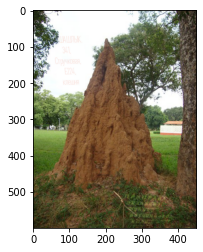

[[[227.43433   66.586876 161.66217  146.03697  163.03743   96.13882
   176.74228  161.0085   178.19827  174.79733  294.70416  464.8236
   481.34003  482.79996  483.2815   483.88278  468.56442  387.21844
   386.35394 ]
  [275.35034  322.3744   258.3588   275.5581   243.83266  273.3523
   248.65833  239.26888  234.98721  242.11832  350.9239   567.6487
   573.1606   556.99817  564.7401   554.3601   572.2378   583.3773
   589.7192  ]
  [266.022    322.36734  258.35132  275.549    243.82463  273.34406
   248.64981  239.26012  234.97815  242.10913  333.31543  567.6439
   573.4289   556.99133  564.7334   554.3544   570.9353   582.70154
   589.966   ]
  [218.10599   66.57983  161.6547   146.02791  163.0294    96.13058
   176.73376  160.99974  178.18921  174.78815  277.0957   464.81885
   481.60834  482.79312  483.27478  483.87704  467.26193  386.54266
   386.60077 ]]

 [[311.68964  360.9372   384.6791   404.34326  432.42664  456.43814
   480.60718  504.8519   529.2186   553.68774  311.73032  2

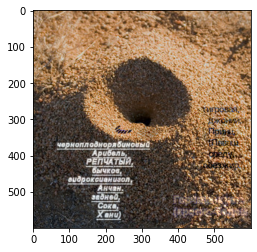

[[[241.61748 270.11505 288.79166 314.5648 ]
  [319.73248 305.90356 363.86783 383.96304]
  [309.96222 318.51257 379.99857 377.8306 ]
  [231.84721 282.72406 304.9224  308.43234]]

 [[304.9443  213.91135 238.19583 319.05902]
  [327.78555 180.9748  169.48758 335.59753]
  [361.19913 194.67563 187.11331 361.33038]
  [338.35788 227.61218 255.82156 344.79187]]]
['наличие,', '170', 'бузины,', 'килька)']


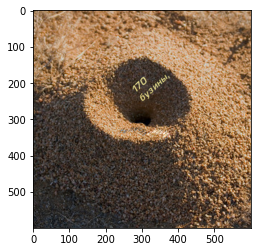

[[[431.34326   511.67017   519.24      480.9797    475.34674
   471.9551    429.43097   425.93573   424.0921     24.085423
    36.021378  539.25995   537.8049    533.51215     4.8350716
    13.421225 ]
  [497.58527   532.4839    557.95984   589.58984   570.19305
   564.43005   523.057     516.9248    524.04456    55.18587
    63.007984  593.0378    601.1401    588.6529     34.95007
    72.866135 ]
  [500.75696   542.25525   560.8236    585.8429    566.7597
   561.843     521.1931    515.89276   523.0162     61.838573
    69.853165  591.9471    596.72076   587.0302     39.6359
    76.69766  ]
  [434.51495   521.4415    522.10376   477.23276   471.9134
   469.36807   427.56708   424.9037    423.06372    30.738125
    42.866558  538.16925   533.38556   531.88947     9.520901
    17.252754 ]]

 [[ 29.703194  342.36115   363.38892    54.74534    95.47949
   134.27026   224.53708   249.93094   271.11588   270.37128
   290.0454    191.31447   212.28317   245.3835    299.5188
   315.35742  ]
 

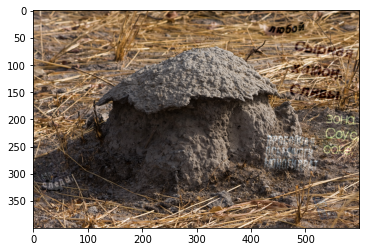

[[[498.21283   508.4035     -1.7304454   9.209356   19.246725
   477.82227   472.49014   457.00815   363.4866   ]
  [593.6734    546.11725    55.31702    48.17324    70.461044
   564.90137   595.7012    593.4497    392.3044   ]
  [592.6241    546.26495    61.660915   55.41723    77.23429
   563.21045   594.88904   592.35156   384.9882   ]
  [497.1635    508.5512      4.613449   16.453346   26.019974
   476.13135   471.678     455.91      356.17038  ]]

 [[335.4169    365.49774   274.46097   293.29132   310.5683
   212.48177   239.6698    262.33252    50.851055 ]
  [339.85898   365.1953    256.6058    281.09607   294.43365
   219.7487    244.53882   270.62555    64.68712  ]
  [362.4083    383.61322   276.8746    304.24066   315.93317
   240.01021   265.0891    288.69373    79.9254   ]
  [357.96622   383.91565   294.72977   316.4359    332.0678
   232.74327   260.2201    280.4007     66.08934  ]]]
['Кранчи', '7г.', 'Кимчи', 'Все,', '(Е954', 'краба);', 'дикалий,', 'пастернак,', 'хл.']


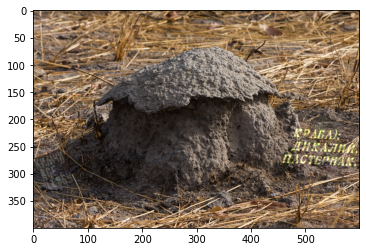

[[[111.01348  125.14021  258.63934  256.5793   257.85666  259.1969  ]
  [139.25534  157.93138  392.2179   404.39883  342.54654  360.2602  ]
  [148.08841  166.3979   392.1756   404.2971   342.36758  360.01318 ]
  [119.84656  133.60674  258.59705  256.47757  257.6777   258.9499  ]]

 [[145.53928  176.57796   19.312506  49.22426   72.59238  104.999794]
  [134.4661   163.75377   19.5794    49.931885  73.18219  106.008865]
  [156.99463  185.40245   40.75972   71.183525  98.8822   130.74771 ]
  [168.06781  198.22664   40.49283   70.4759    98.29239  129.73863 ]]]
['332,', 'СОЯ,', 'воздушная', 'хлористого,', '(Калия', 'Щавель.']


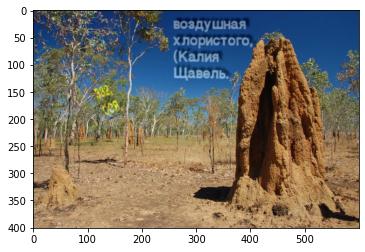

[[[ 15.666918 113.33878  124.921425]
  [ 56.637123 141.27017  139.92404 ]
  [ 62.471046 147.8403   149.13718 ]
  [ 21.50084  119.908905 134.13455 ]]

 [[118.68951  153.36403  178.76862 ]
  [111.48388  142.43398  171.9284  ]
  [144.65472  159.22371  192.13547 ]
  [151.86035  170.15376  198.97568 ]]]
['234,', 'Е172.', '2с,']


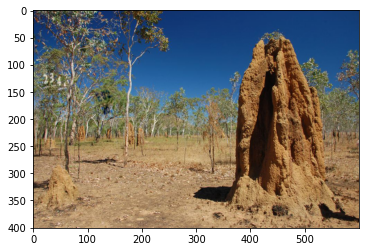

[[[530.71027   195.62926   104.55255    87.979164   85.44024
    96.57264  ]
  [597.9355    257.55377   137.01804   135.20485   127.05924
   123.80395  ]
  [584.0651    257.7406    138.45941   136.59872   128.33334
   124.90148  ]
  [516.8399    195.8161    105.99393    89.37303    86.71435
    97.67017  ]]

 [[ -0.8616352   8.203113  198.08197   211.99359   225.25406
   238.16925  ]
  [ 52.505867    7.735553  195.08218   207.93805   221.94849
   236.17996  ]
  [ 69.97795    32.48184   210.6817    224.16928   237.99026
   251.20401  ]
  [ 16.610449   32.949398  213.68149   228.22482   241.29584
   253.1933   ]]]
['Хлопья', 'ОРЕХ', 'МУКА', '(ванилин', '(цыплят', 'е422']


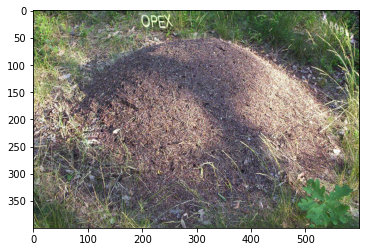

[[[546.27783   549.00757   202.63751     8.51904   318.55725
   289.21738   267.27197   241.37347  ]
  [585.56604   606.59155   247.91983   186.80846   416.29572
   332.1666    338.9405    330.61237  ]
  [573.47034   596.05945   248.11765   187.02342   408.1775
   324.47214   328.15692   318.67316  ]
  [534.1821    538.47546   202.83533     8.734009  310.43903
   281.52292   256.4884    229.43427  ]]

 [[ -1.0935202  33.62181     6.887187   40.51265    44.106083
    59.273487   77.69656    95.563034 ]
  [ 25.364655   67.903336    6.5580244  38.76288    94.33725
    74.97977   111.24689   142.56454  ]
  [ 43.32572    85.59447    33.77061    60.666992  110.13345
    96.02049   134.28223   165.23274  ]
  [ 16.867546   51.312943   34.099773   62.416763   59.902287
    80.31421   100.7319    118.23124  ]]]
['(212', 'Мини)', 'СОК', '(Истринский', 'кедровые,', 'цб;', 'Е252)', 'майлар,']


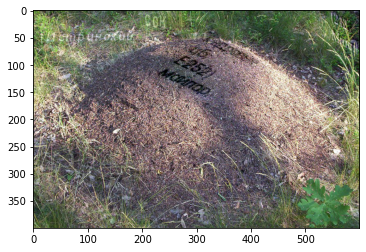

[[[ 70.746826]
  [208.74957 ]
  [205.70972 ]
  [ 67.70697 ]]

 [[ 18.794996]
  [ 32.53072 ]
  [ 63.07202 ]
  [ 49.3363  ]]]
['тамаринда,']


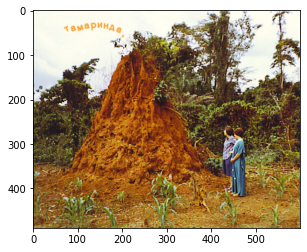

[[[315.81067  306.57126  415.03046  408.59015   12.783077  14.410305
    15.600679  17.004614]
  [347.89178  351.1121   485.04218  484.5937   127.55058   73.71721
    51.364937  53.72885 ]
  [343.77307  346.76346  485.4605   484.8822   126.15152   73.6315
    51.20546   53.52166 ]
  [311.69196  302.22263  415.4488   408.87866   11.384014  14.324604
    15.441202  16.797422]]

 [[153.33865  165.46432   17.762981  55.359898  12.434863  49.677982
    74.10262  102.90927 ]
  [160.4086   175.26334   16.836536  54.25884   19.53973   49.93959
    74.3227   103.21069 ]
  [179.09802  195.02988   48.45116   74.1752    42.139385  69.36864
   100.23899  128.45485 ]
  [172.02808  185.23087   49.377605  75.27626   35.03452   69.10703
   100.01891  128.15343 ]]]
['Турбо', '(молочн', 'кефирной', 'сливочного,', 'байкальская,', 'плодов', '223,', '798,']


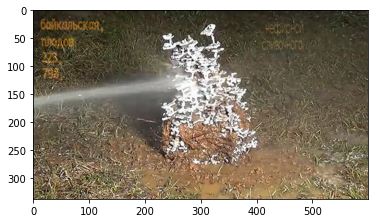

[[[355.1071 ]
  [385.3505 ]
  [381.1923 ]
  [350.94888]]

 [[180.421  ]
  [186.71294]
  [206.7    ]
  [200.40807]]]
['НПС,']


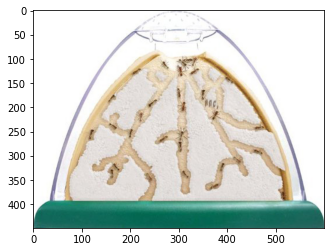

[[[ 19.483198    7.7000923   7.65246    19.244116   24.877575
     1.8221245  18.798222   18.70387     7.3704014 210.20383
   175.83646  ]
  [ 55.428886   66.959564   60.519096   44.193672   39.73351
    64.97122    44.009678   51.08258    59.575317  241.75235
   220.76556  ]
  [ 55.4327     66.90794    60.420433   44.008614   39.503544
    64.73607    43.781563   50.693428   59.162514  238.66486
   215.52667  ]
  [ 19.487015    7.6484795   7.553797   19.059061   24.64761
     1.5869789  18.570107   18.314718    6.9575977 207.11633
   170.59756  ]]

 [[123.61081   139.88635   158.11667   170.9419    188.69875
   207.79668   224.25905   236.11609   252.60316    64.85951
    64.836426 ]
  [123.603424  140.0437    158.40579   171.1529    188.86516
   208.6587    224.5991    236.72815   253.724      70.7722
    76.413925 ]
  [142.21408   159.48337   176.44766   193.03424   209.39555
   225.88484   241.5117    257.31482   272.95117    87.24623
    96.7446   ]
  [142.22147   159.32602   176.

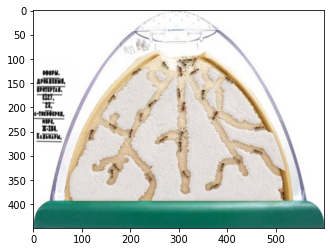

[[[107.88602  455.00134  456.69885   65.32239 ]
  [134.13669  569.8965   572.63635   99.808685]
  [146.45851  569.6044   572.6881   110.885956]
  [120.20784  454.70923  456.7506    76.39966 ]]

 [[214.57227    4.722696  28.269306 200.22658 ]
  [196.20248    6.676962  27.927876 175.95412 ]
  [213.81055   23.849957  45.50417  191.6927  ]
  [232.18033   21.89569   45.8456   215.96516 ]]]
['вок,', 'панеттоне,', 'регулятор,', 'литА,']


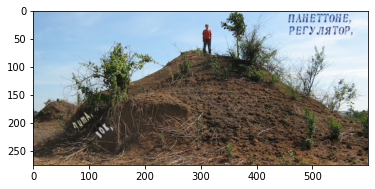

[[[ 79.55855   89.843475]
  [106.86722  113.44647 ]
  [114.86839  121.24333 ]
  [ 87.55972   97.640335]]

 [[198.8296   210.65988 ]
  [179.6306   194.10721 ]
  [191.01149  205.225   ]
  [210.2105   221.77768 ]]]
['натстручки', 'говядину.']


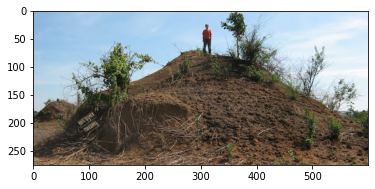

[[[403.19766]
  [476.76584]
  [465.42032]
  [391.85214]]

 [[ 89.91879]
  [117.93784]
  [147.72713]
  [119.70808]]]
['колор,']


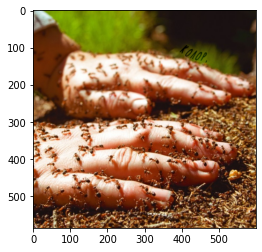

[[[399.23315]
  [440.96045]
  [435.92664]
  [394.19934]]

 [[104.43711]
  [117.89796]
  [133.50223]
  [120.04139]]]
['Е263,']


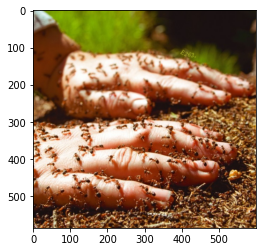

[[[120.8094   113.355286 120.21833 ]
  [175.65276  180.12503  162.22382 ]
  [183.94514  187.90555  171.55234 ]
  [129.10179  121.1358   129.54684 ]]

 [[375.1043   396.26028  413.57486 ]
  [350.8645   369.05576  394.28012 ]
  [369.62628  388.15195  414.5887  ]
  [393.8661   415.35648  433.88345 ]]]
['(ЛЕСНОЙ', 'ароматиз,', 'Е122);']


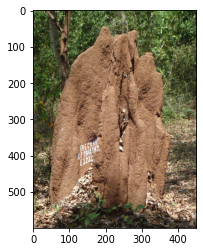

[[[ -4.7519703  -0.759182    4.085659 ]
  [ 28.529247   36.329628   44.790726 ]
  [ 39.609825   47.33283    54.978012 ]
  [  6.3286057  10.244019   14.272945 ]]

 [[187.12233   202.12929   215.00844  ]
  [117.583405  126.18656   133.3098   ]
  [122.88655   131.56029   138.38545  ]
  [192.42548   207.50302   220.08409  ]]]
['Катин,', 'Роллы,', 'Сухари']


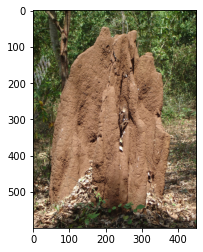

[[[121.90068 132.67189]
  [267.65704 262.9002 ]
  [267.53247 262.80402]
  [121.77611 132.57573]]

 [[279.81793 329.25772]
  [280.35345 329.5638 ]
  [314.25696 370.47574]
  [313.72144 370.16965]]]
['жидкость,', 'стебелек)']


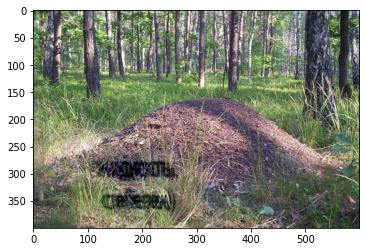

[[[368.76782 372.81598 374.92297 376.39905 377.02005 181.52393 455.03372
   242.85    244.65096]
  [579.98865 527.43774 545.3765  454.852   469.543   226.95816 594.94324
   259.77347 279.89447]
  [577.3467  525.9412  543.9106  453.79248 468.83902 245.44724 594.2781
   261.55554 280.99774]
  [366.12585 371.31946 373.45703 375.33954 376.31607 200.013   454.36856
   244.63208 245.75421]]

 [[ 76.76081 115.9427  151.61891 187.6674  228.37192 310.62997 321.85703
   202.72855 220.10382]
  [ 97.42251 124.20201 160.44267 190.61601 231.59482 261.15524 326.14072
   200.6712  217.36276]
  [124.43108 152.21788 188.76137 218.80641 251.80374 278.13437 347.86417
   215.33041 231.54828]
  [103.76939 143.95857 179.9376  215.8578  248.58084 327.6091  343.58047
   217.38776 234.28934]]]
['Желирующая;', 'каноловое)', 'Городецкая,', 'фазе;', 'молоч,', '4466.', 'мехобвалки,', 'ЦБ,', 'вина,']


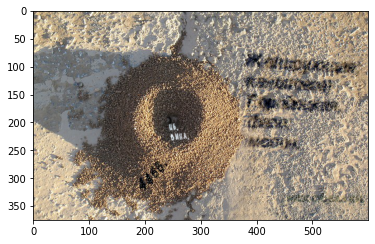

[[[417.41617 369.81406 396.52917]
  [506.96664 553.0271  521.09735]
  [505.4827  551.6477  518.84656]
  [415.93222 368.43466 394.27838]]

 [[100.53061 131.0143  162.79295]
  [105.71686 140.11748 173.77995]
  [131.33954 167.8791  199.29866]
  [126.15329 158.77592 188.31166]]]
['(Е952', 'Творожно);', '(бадьян']


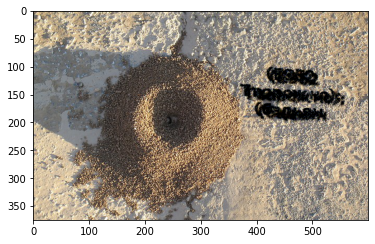

[[[123.06739  124.710365]
  [170.26765  169.29456 ]
  [170.29999  169.32312 ]
  [123.09972  124.73892 ]]

 [[319.94928  342.97876 ]
  [319.8667   342.9148  ]
  [338.33368  362.81287 ]
  [338.41626  362.87683 ]]]
['зернового.', 'САХАРНАЯ,']


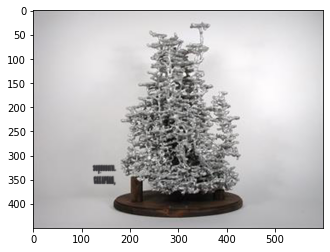

[[[324.8885  300.6817  209.48375 209.45392 215.50224]
  [419.2553  414.19293 270.6255  282.8161  263.76044]
  [410.64996 407.99243 264.67938 276.272   259.12317]
  [316.28314 294.4812  203.53767 202.90982 210.86494]]

 [[190.76572 232.52739 239.97757 262.2499  295.16684]
  [222.3363  263.79855 257.03024 284.09555 310.0032 ]
  [248.05835 286.30573 278.34964 306.07193 325.08694]
  [216.48776 255.03458 261.29697 284.2263  310.25058]]]
['КРАБ,', 'цезарь,', '(ОРЕХИ', 'шелухи)', 'воск,']


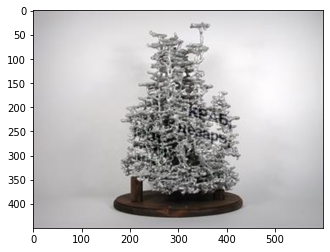

[[[218.07462  472.23148  470.72046 ]
  [251.48288  489.50266  501.49695 ]
  [247.97946  497.91977  501.61072 ]
  [214.5712   480.6486   470.83423 ]]

 [[311.9743     1.950139  19.664288]
  [319.80652   -4.845063  19.445812]
  [334.7503    16.548409  35.46824 ]
  [326.9181    23.343609  35.686714]]]
['ПЦ,', '(Он', 'Е415,']


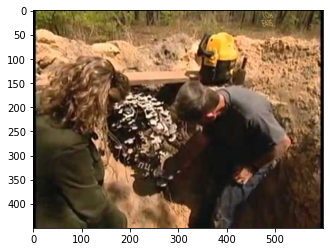

[[[411.0787    560.99664    22.645828   21.187225   19.572983
   373.42352    37.962875   35.251812 ]
  [533.1968    585.8278    186.45686   186.2711    177.79012
   441.83185   149.93855   167.33371  ]
  [532.27954   585.9494    186.36815   186.09445   177.67564
   440.92413   149.8868    167.86476  ]
  [410.1614    561.1182     22.557114   21.010574   19.458511
   372.5158     37.911118   35.782867 ]]

 [[ 52.68986   140.63991    68.11556    95.57823   123.3844
     3.9203358  28.192345   52.163296 ]
  [ 56.1167    140.42888    68.68012    96.80438   124.13364
     6.2199974  28.459953   49.11655  ]
  [ 88.80498   154.73924    94.420494  120.587906  148.30548
    33.221146   50.113976   72.138885 ]
  [ 85.37814   154.95027    93.855934  119.361755  147.55624
    30.921482   49.846367   75.18564  ]]]
['камеди', '(05', 'неразделенная);', 'Клементиновый;', 'бактериальной,', 'Плюс,', 'витамина)', 'Клубничное']


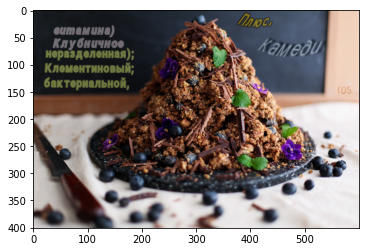

[[[4.45129883e+02 4.29949585e+02 4.17421906e+02 3.92157043e+02
   4.31258209e+02]
  [4.98952148e+02 4.81161133e+02 5.39981445e+02 5.16177246e+02
   5.26269287e+02]
  [4.98426453e+02 4.80801575e+02 5.36520630e+02 5.12941589e+02
   5.23681030e+02]
  [4.44604187e+02 4.29590027e+02 4.13961090e+02 3.88921387e+02
   4.28669891e+02]]

 [[8.28757858e+01 1.12523735e+02 3.02635193e-01 4.84294777e+01
   2.84594765e+01]
  [8.39552536e+01 1.13132492e+02 1.35525284e+01 6.04732208e+01
   3.77623711e+01]
  [1.10166115e+02 1.43379333e+02 4.55646286e+01 9.37922058e+01
   6.41972809e+01]
  [1.09086647e+02 1.42770584e+02 3.23147354e+01 8.17484589e+01
   5.48943901e+01]]]
['лук,', '12А,', 'Базовая,', 'Зеленое,', 'Крабовое)']


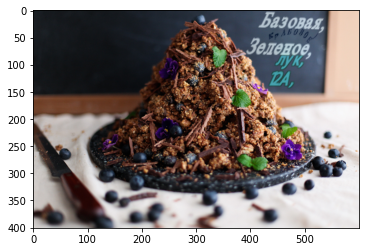

[[[499.10278 484.37302 468.29666 300.46896 462.6078  450.03702]
  [564.8197  535.5984  549.3574  458.97214 582.037   577.37415]
  [563.344   534.5171  549.16223 459.53165 579.6642  575.9806 ]
  [497.62708 483.29172 468.10147 301.02847 460.235   448.64346]]

 [[336.58316 368.086   397.04514 396.3288  278.97842 302.49292]
  [341.1862  370.5113  397.58676 393.6056  289.66867 308.38593]
  [362.25406 393.35004 426.80527 426.17255 316.17783 338.4975 ]
  [357.65103 390.92474 426.26364 428.89575 305.48758 332.6045 ]]]
['нектар,', 'аира;', 'градусы,', 'мандариновый.', 'Абрикосовое,', 'зародышевые).']


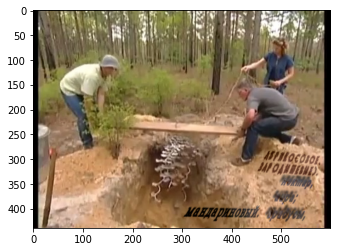

[[[122.6437   463.66098  446.89365  413.79782 ]
  [124.81353  496.13943  463.38968  471.8044  ]
  [108.77668  480.01907  448.28665  468.986   ]
  [106.60685  447.54062  431.79062  410.9794  ]]

 [[160.15741  313.2905   349.89175  389.165   ]
  [114.48801  328.1221   358.09494  394.47903 ]
  [113.726074 363.42264  388.46597  425.24454 ]
  [159.39548  348.59103  380.2628   419.9305  ]]]
['Е470', '(живых', '140.', '500-1000,']


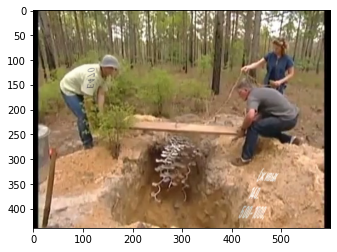

[[[121.63234 ]
  [281.79788 ]
  [281.9203  ]
  [121.75476 ]]

 [[ 30.77211 ]
  [ 29.877373]
  [ 51.792274]
  [ 52.68701 ]]]
['полифосфат,']


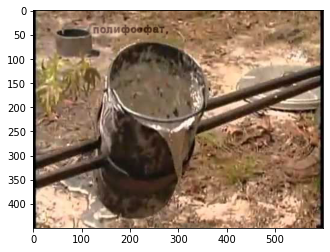

[[[372.32245   45.07238   49.893494  53.518475  56.928467]
  [435.51508  175.76169  184.10704  138.60315  153.01898 ]
  [457.80347  175.4076   184.30536  137.4309   151.23946 ]
  [394.61084   44.7183    50.091812  52.34622   55.14894 ]]

 [[147.28802  121.28652  159.08264  186.08401  221.26498 ]
  [109.75175  122.98241  158.05896  190.04129  228.60223 ]
  [147.27441  150.26797  184.06055  215.24564  251.90738 ]
  [184.8107   148.5721   185.08423  211.28836  244.57013 ]]]
['бульйон', '(ккал/кДж', 'картофеля)', 'стебли,', 'Камера,']


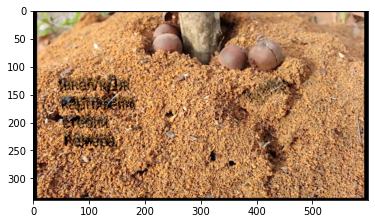

[[[477.18057  492.35596  460.3098   475.66278  523.6129   480.18854 ]
  [569.5328   545.557    583.61523  554.9884   598.4822   517.4575  ]
  [569.5796   545.6221   583.7219   555.0983   586.0354   517.439   ]
  [477.22736  492.42102  460.4165   475.7727   511.16614  480.17004 ]]

 [[ 12.6733    37.80536   59.487503  89.09214  334.3374   365.96106 ]
  [ 12.392794  37.58338   58.853424  88.57812  377.05347  366.01044 ]
  [ 27.804785  53.17885   79.60655  105.545265 398.86926  379.98822 ]
  [ 28.08529   53.400826  80.24063  106.05929  356.1532   379.93884 ]]]
['глюкозы,', 'алоэ;', '(ежевичное', 'сиропе,', 'Черри;', 'сир;']


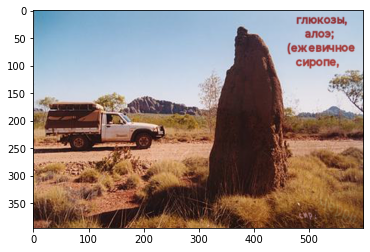

[[[515.8016    527.5851    494.00952     3.5717678 529.71674
   203.91692  ]
  [567.951     564.5724    582.7777     45.9833    584.6462
   257.04312  ]
  [568.0273    564.63806   582.8745     44.289757  565.70233
   258.32257  ]
  [515.87787   527.65076   494.10632     1.8782215 510.7729
   205.19635  ]]

 [[ 30.909407   51.306763   65.21648   117.66455   329.1103
    81.35376  ]
  [ 30.668882   51.129646   64.673096  121.3586    364.8957
    78.57976  ]
  [ 47.2126     64.83883    80.48384   140.8023    393.97388
   103.08298  ]
  [ 47.453125   65.015945   81.02722   137.10826   358.18848
   105.85698  ]]]
['(925/221', 'пасту', 'Созреватель.', 'кКал;', 'ши,', 'Е4711']


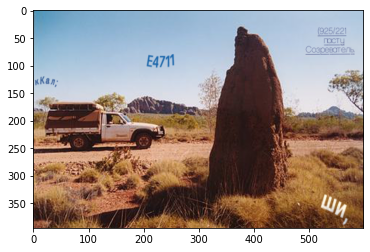

[[[ 16.78232    18.739193  234.2515    229.21558  ]
  [ 75.2251     67.46016   271.16922   266.45398  ]
  [ 75.19915    67.3746    263.33517   258.15097  ]
  [ 16.756372   18.653645  226.41745   220.91257  ]]

 [[  5.2508397  30.077131  181.84334   194.99884  ]
  [  5.3153114  30.259453  204.70137   217.638    ]
  [ 28.838604   53.119644  217.35405   231.29535  ]
  [ 28.774132   52.937325  194.49602   208.65619  ]]]
['Персипан,', 'ежевики,', 'АО.', 'юр.']


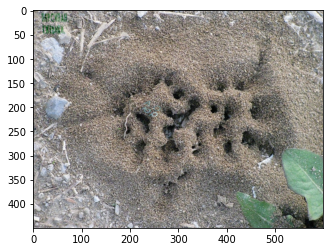

[[[439.8253    20.162998  22.9276    73.73175   73.72743   59.200962
    73.79549   72.84841   59.26829   58.26699 ]
  [483.62643   90.37186   96.73787  159.42368  151.39076  158.2685
   177.14151  152.21182  164.04234  186.82501 ]
  [483.4205    90.344086  96.63873  159.62448  151.55891  158.36377
   177.16783  152.16263  163.9137   186.6189  ]
  [439.61935   20.135227  22.828465  73.932556  73.895584  59.296234
    73.82181   72.79923   59.139645  58.060875]]

 [[399.5997     9.686589  35.83658   85.789154 108.64065  135.66696
   160.07576  187.94736  213.43959  239.95598 ]
  [399.86765    9.797113  36.157837  84.93091  108.096275 135.26996
   159.97124  188.10461  213.96019  240.97833 ]
  [433.53226   27.438442  58.93389  104.98033  132.08664  159.04501
   185.99208  212.9252   239.85176  266.896   ]
  [433.2643    27.327917  58.612633 105.83858  132.63101  159.44202
   186.0966   212.76794  239.33116  265.87363 ]]]
['е553,', 'солодовые,', 'Мышечные).', 'восковая,', 'Белки-8г,', 'Па

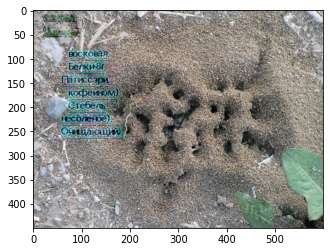

[[[ 3.4288892e+02  3.4838254e+02  3.5972525e+02  3.7100037e+02
    3.4859814e+02  3.5061090e+02 -2.0350647e-01  7.3646530e+01
    2.0614204e+02]
  [ 3.5307495e+02  3.7246591e+02  3.8819730e+02  3.9642700e+02
    4.1934460e+02  4.2862012e+02  1.7481477e+02  1.1823389e+02
    2.8680615e+02]
  [ 3.6094690e+02  3.8034897e+02  3.9594608e+02  4.0423187e+02
    4.1931158e+02  4.2774133e+02  1.7478481e+02  1.1812840e+02
    2.8895435e+02]
  [ 3.5076086e+02  3.5626559e+02  3.6747403e+02  3.7880524e+02
    3.4856512e+02  3.4973212e+02 -2.3347473e-01  7.3541046e+01
    2.0829022e+02]]

 [[ 1.5248354e+02  1.7336501e+02  1.9193785e+02  2.0964221e+02
    2.8695841e+01  5.5986786e+01  4.0707539e+01  8.5778786e+01
    3.9739712e+01]
  [ 1.4594850e+02  1.5789552e+02  1.7225597e+02  1.9193265e+02
    2.8790028e+01  5.9003342e+01  4.0876015e+01  8.5924538e+01
    3.2792995e+01]
  [ 1.5821837e+02  1.7016811e+02  1.8346544e+02  2.0313861e+02
    5.3592995e+01  8.1728500e+01  7.2012650e+01  1.1818978e+02
  

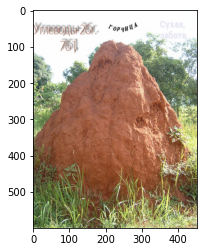

[[[265.07706 194.47118]
  [373.22787 269.46762]
  [369.09396 269.55713]
  [260.94315 194.5607 ]]

 [[538.8036  570.6415 ]
  [551.4177  570.32385]
  [586.8611  591.4606 ]
  [574.24695 591.7782 ]]]
['фарш,', 'Е251,']


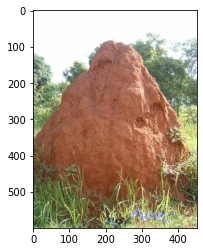

[[[156.32019]
  [194.9555 ]
  [195.91547]
  [157.28015]]

 [[360.64795]
  [359.3614 ]
  [388.1897 ]
  [389.47626]]]
['58,']


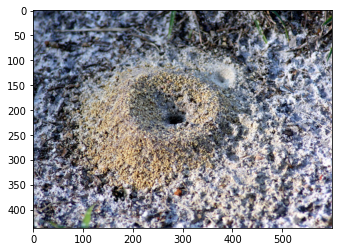

[[[314.725    177.45602  185.30786  281.57117  287.94687 ]
  [386.2722   222.34033  271.72974  441.66284  391.31723 ]
  [387.94284  226.15997  275.3345   440.5016   390.88608 ]
  [316.39566  181.27567  188.91263  280.4099   287.51572 ]]

 [[320.6188   192.64813  214.30077   32.45244  406.56775 ]
  [316.05972  182.66791  197.92802   39.138527 408.68726 ]
  [342.27774  199.84613  216.95546   66.943954 429.7162  ]
  [346.83682  209.82635  233.3282    60.257866 427.59668 ]]]
['цедра,', 'Также', 'зелено-белом,', 'Овсяная', 'пшенич)']


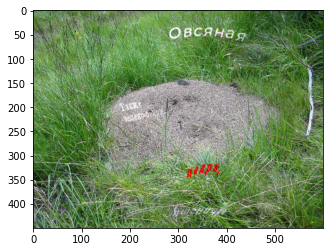

[[[340.74072 327.4955 ]
  [362.7893  367.4661 ]
  [360.63165 365.98746]
  [338.58307 326.01688]]

 [[313.63882 341.35574]
  [315.70828 343.85373]
  [338.69644 367.51334]
  [336.62698 365.01535]]]
['Е435,', '(конопли']


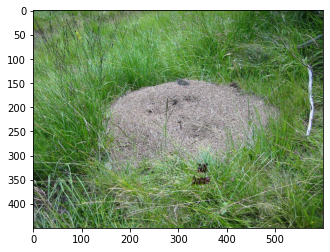

[[[538.1455  ]
  [562.2787  ]
  [568.0531  ]
  [543.9199  ]]

 [[109.5781  ]
  [ 98.7248  ]
  [111.564735]
  [122.41804 ]]]
['96.']


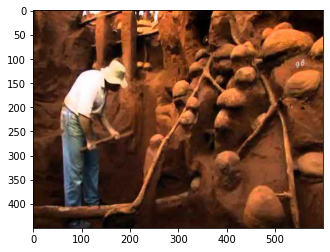

[[[ 28.27256   10.919735 398.7009   421.03503   58.92721   83.33993 ]
  [ 70.70136  103.64851  516.8607   571.07007  160.84639  149.99637 ]
  [ 70.541695 103.465225 515.03687  568.4498   160.06616  149.82587 ]
  [ 28.112892  10.736439 396.87704  418.4148    58.146984  83.169426]]

 [[162.9234   188.1886   247.98291  270.134    222.55414  248.89825 ]
  [163.24484  188.97653  259.16202  287.7701   227.16562  249.64642 ]
  [184.32028  210.54813  278.4394   310.06113  244.4096   264.8363  ]
  [183.99884  209.7602   267.26028  292.42502  239.79813  264.08813 ]]]
['яич,', 'ПШЕНИЦА.', 'Е1214,', 'Залом),', '2-замещенные,', 'закваски,']


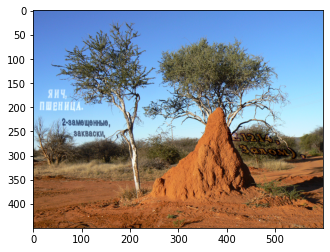

[[[349.42535  332.45544   13.984962  16.610256  21.925411 439.70377
   428.75507 ]
  [425.49945  396.37805   66.41357   97.3076    88.89365  495.079
   477.54297 ]
  [426.1435   395.8813    64.21187   97.11037   88.69171  495.28146
   474.17035 ]
  [350.0694   331.95868   11.783264  16.413021  21.723476 439.90622
   425.38245 ]]

 [[379.66953  419.57965  142.50867  181.67934  222.46745   25.830183
   403.1145  ]
  [377.94028  420.97235  148.00833  182.34587  223.11949   25.42095
   409.63782 ]
  [406.27444  443.77374  168.99731  206.2259   243.85973   52.81713
   434.86163 ]
  [408.0037   442.38104  163.49765  205.55937  243.20769   53.226364
   428.33832 ]]]
['(9манго', 'хинин,', 'Песто,', 'ФАРШИК,', 'куркума.', '(Ж13', 'воде,']


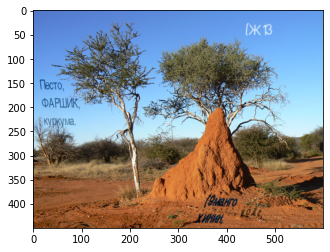

[[[268.24484  272.7772   277.33176  281.75897  285.77646  289.95908
   293.82178   22.285694  19.520416]
  [329.02994  316.61246  348.16898  308.81207  325.92123  322.007
   351.456    116.62634  108.81662 ]
  [330.285    318.07285  349.52805  310.31207  327.08572  323.58524
   353.15515  116.27409  108.48839 ]
  [269.4999   274.23758  278.69083  283.25897  286.94095  291.53732
   295.52094   21.933445  19.19218 ]]

 [[338.13876  363.85254  390.78394  415.9012   438.82828  463.94055
   485.91937  525.43274  555.2846  ]
  [333.81418  360.3225   384.9436   413.52438  436.09012  460.79254
   479.98383  527.22473  556.54    ]
  [351.45462  378.45764  401.42773  430.59763  453.16318  476.8598
   496.4826   545.7698   579.88715 ]
  [355.7792   381.98767  407.26807  432.97446  455.90134  480.0078
   502.41815  543.9778   578.6318  ]]]
['(назначения', 'твердой.', '(кокосового', 'соль,', 'Феймос,', 'валин,', 'майонезный,', 'аммиачной.', 'ВЫСШЕГО,']


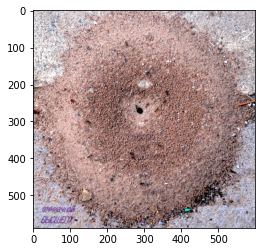

[[[258.9251   310.96475  285.22867  319.36578  352.20898  356.32755
   332.1652   361.93835  424.76346  447.74652  431.83423  435.3594
   437.80383  438.91785  444.44507   83.99676 ]
  [432.46118  409.25174  414.17435  408.6869   395.5374   387.42953
   412.28415  567.7157   541.8658   534.10754  517.48804  535.3438
   551.10675  541.14984  552.3782   142.80396 ]
  [433.54724  410.1094   415.31876  410.21246  397.9956   384.83865
   413.50357  566.59937  542.5797   533.38654  521.05115  536.53
   551.0316   544.3217   554.10004  142.3009  ]
  [260.01117  311.82242  286.37308  320.89136  354.66718  353.73666
   333.3846   360.82202  425.47742  447.0255   435.39734  436.5456
   437.7287   442.08972  446.16693   83.49369 ]]

 [[141.28763  175.46136  208.21747  238.67938  267.72726  297.29117
   333.59116   60.35579  117.832115 155.69261  206.75674  250.51836
   283.65805  326.6815   366.08597  554.97754 ]
  [135.07068  171.38586  202.57019  233.63828  263.65244  301.64792
   327.8912    6

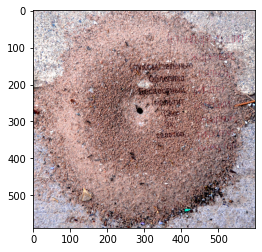

[[[494.45825 492.2087 ]
  [528.5733  561.7606 ]
  [526.0383  558.9634 ]
  [491.92328 489.41147]]

 [[225.01619 244.04895]
  [229.96758 255.21301]
  [247.4334  272.64   ]
  [242.48201 261.47595]]]
['Е315', 'веками,']


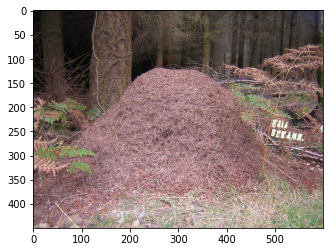

[[[440.69858   460.2712     68.30412   125.28712   127.90688  ]
  [494.21732   513.07336   113.22548   169.63676   179.50272  ]
  [491.56705   513.74585   116.229095  180.28061   190.35373  ]
  [438.0483    460.94373    71.30774   135.93095   138.7579   ]]

 [[ 11.941293   57.313606  104.20984    37.12455    60.367596 ]
  [ 17.047607   55.97608    97.58226    -6.202614   17.67619  ]
  [ 44.824585   82.52543   117.9406      4.6924133  30.790485 ]
  [ 39.71827    83.86295   124.56818    48.019577   73.48189  ]]]
['е466),', 'Мидия', 'база,', 'АО.', 'Мак,']


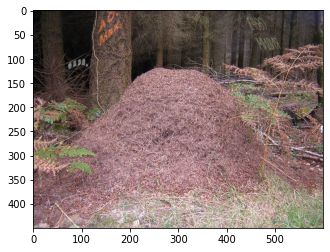

[[[  5.9774895   5.6850166   7.16539     4.578369  439.4709
   439.48666   480.5542    481.06482  ]
  [ 73.76715    68.82912    79.00935    76.01375   461.9444
   474.53384   566.3839    593.99023  ]
  [ 58.406506   64.02911    58.67005    69.42389   461.98993
   474.62344   565.9702    594.229    ]
  [ -9.38316     0.8850136 -13.17391    -2.0114899 439.51642
   439.57626   480.1405    481.3036   ]]

 [[ 22.017506   89.96048   123.4083    185.41165    32.819466
    62.307594   71.52628   104.35525  ]
  [ 54.149826   96.90567   176.88188   216.83795    32.77803
    62.19404    72.744286  103.44541  ]
  [ 86.556244  140.54626   204.20859   231.81741    57.487007
    89.8545    101.89822   133.0759   ]
  [ 54.42392   133.60107   150.735     200.39111    57.528442
    89.968056  100.680214  133.98575  ]]]
['КДВ,', 'отруб,', 'бульон,', 'молочно', '130,', '(Е951', '(цитарт', '(базилика']


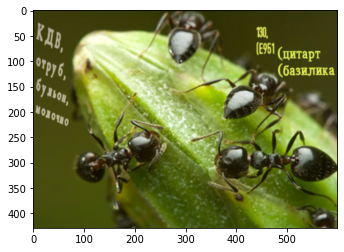

[[[149.1778  ]
  [187.65152 ]
  [190.1062  ]
  [151.63248 ]]

 [[ 36.377502]
  [ 31.334757]
  [ 50.062813]
  [ 55.10556 ]]]
['охл,']


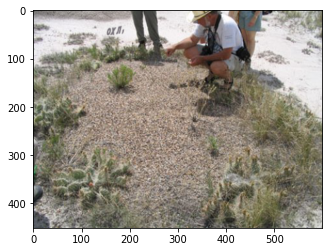

[[[221.02702  220.97578  220.96701  220.95879  220.94806  551.26935
    56.390804  37.646538  38.70875   38.641144  38.57449   38.50775
    38.44104   38.37425   38.307404  38.240524  37.039135  38.10739
    38.040115  37.972626]
  [289.93286  362.9874   375.5729   334.68225  478.26938  592.6209
   103.78066  155.35252  123.618744 119.0666    83.92945  121.261284
    99.658905 164.27095   93.89461   87.0391   125.59163   82.4149
   114.14318  128.8894  ]
  [289.09833  362.99945  375.58212  334.68732  478.27454  588.6774
   108.50351  155.36465  123.63197  119.07965   83.941315 121.27197
    99.668365 164.27919   93.90166   87.044945 125.59627   82.41759
   114.14491  128.89035 ]
  [220.19246  220.98782  220.97623  220.96387  220.95322  547.32587
    61.113655  37.658676  38.721985  38.654198  38.586357  38.51844
    38.4505    38.382492  38.314453  38.24637   37.043777  38.110077
    38.041847  37.97357 ]]

 [[235.46767  270.15558  299.71558  323.60254  353.23303  152.76123
    29.0653

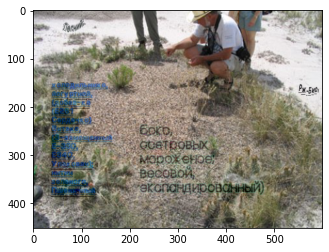

[[[130.59775 ]
  [182.37189 ]
  [174.83047 ]
  [123.056335]]

 [[ 77.17964 ]
  [ 92.98932 ]
  [117.68617 ]
  [101.876495]]]
['Е571.']


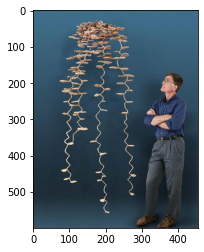

[[[205.14267    -4.206531 ]
  [235.3613     47.709824 ]
  [233.08972    57.78869  ]
  [202.8711      5.8723335]]

 [[165.82271   484.49915  ]
  [169.44511   443.46954  ]
  [188.39479   456.22272  ]
  [184.77238   497.25232  ]]]
['НА,', '5-20']


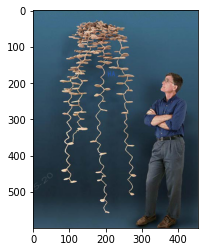

[[[501.85287  525.42584 ]
  [595.9734   592.01324 ]
  [587.2654   592.9388  ]
  [493.14487  526.3514  ]]

 [[  8.990295   8.042075]
  [ 30.298111   5.823016]
  [ 68.76311   33.59552 ]
  [ 47.45529   35.81458 ]]]
['Хондаши.', 'Е229,']


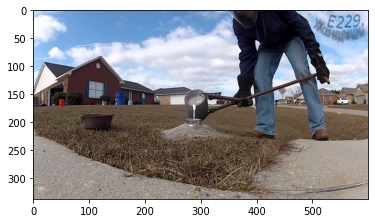

[[[479.03946   479.69003   205.51491   196.21664     1.1914474
     1.8472862   3.612936    3.400517    3.9930432   4.6898875
     5.4437404   7.257324  260.61588  ]
  [565.3245    562.8956    244.31413   283.03156   138.30171
    90.17682   105.50088   152.96126   175.69029   120.014435
   173.10728   147.53639   318.05597  ]
  [566.10864   562.8822    235.94804   274.03745   138.46794
    89.60693   105.51203   153.1751    176.2108    120.19847
   173.77362   146.83897   305.61343  ]
  [479.82355   479.6766    197.14882   187.22253     1.3576813
     1.2773933   3.624092    3.6143494   4.51355     4.8739243
     6.110077    6.559906  248.17332  ]]

 [[175.26651   199.14168   141.49545   152.69803   152.88472
   177.04399   202.66365   239.23538   260.63535   287.3769
   318.3059    343.32095   117.62305  ]
  [172.33807   199.20409   172.84344   223.70505   151.61754
   179.56981   202.62025   237.44543   257.23935   286.56085
   314.09735   347.0784    158.87506  ]
  [195.44095   217

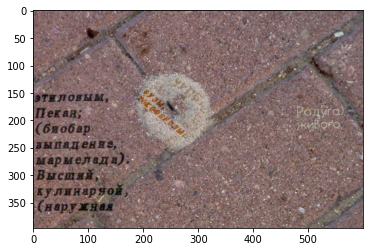

[[[435.48633 442.74533 450.41547]
  [496.3443  501.4617  471.65424]
  [495.35547 496.10056 476.80273]
  [434.4975  437.3842  455.56396]]

 [[324.5507  355.02432 389.98593]
  [327.038   367.42123 385.42648]
  [351.23178 392.81375 409.40933]
  [348.74448 380.41684 413.96878]]]
['20кДж)', '(рожок', 'б/г']


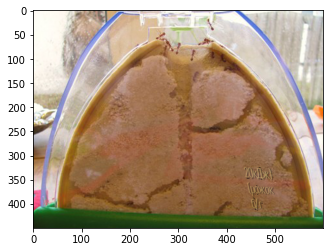

[[[359.67526 345.71277 561.11975]
  [443.88718 478.6538  605.126  ]
  [442.12454 476.66833 593.19836]
  [357.91263 343.7273  549.19214]]

 [[321.7331  344.50928  68.4772 ]
  [328.5642  357.0412   96.21416]
  [350.29327 378.10352 115.138  ]
  [343.46216 365.5716   87.40105]]]
['(Сост', 'Брокколи', 'Е40,']


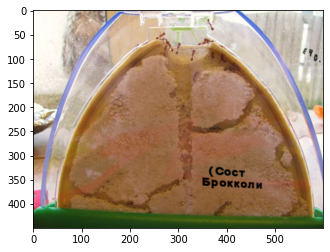

[[[129.63065 161.59042]
  [162.08292 203.78683]
  [157.66931 209.70337]
  [125.21705 167.50696]]

 [[ 99.72745 373.40372]
  [109.57706 363.0264 ]
  [124.1189  387.08432]
  [114.26929 397.46164]]]
['761,', 'Спинка,']


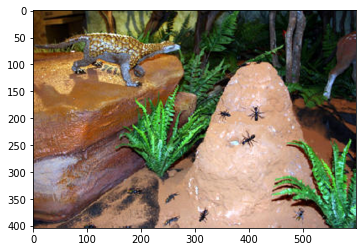

[[[402.03687   397.89056   395.993     392.5821     90.849915
   102.117874  542.0335     40.29196  ]
  [477.44604   479.46887   484.02847   431.3512    203.14621
   216.86183   570.90765    69.67973  ]
  [467.97693   470.378     475.12234   422.55115   196.60516
   209.74553   528.8105     70.00194  ]
  [392.56775   388.79968   387.08688   383.78204    84.30887
    95.00157   499.93634    40.614166 ]]

 [[  2.3565674  17.904478   34.301773   49.321114   90.42221
   121.14904    88.72368   274.73273  ]
  [ 55.323524   73.54125    93.5214     75.43996   136.30682
   169.59474   153.40985   274.34064  ]
  [ 68.80473    86.87094   106.76114    88.502205  152.31517
   186.4497    172.20088   298.4886   ]
  [ 15.837776   31.234167   47.54151    62.383358  106.43056
   138.00401   107.5147    298.88068  ]]]
['органический', 'подкопченная', '(сывороточный', 'рапса,', 'Св-во,', 'Окунь.', 'гренки,', '422']


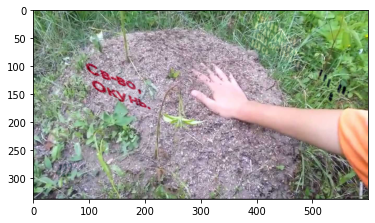

[[[ 61.332306   60.370922   59.473015  186.9996    254.13626
   225.84206   468.7917   ]
  [ 95.28424    85.379715   72.083015  230.18808   356.1158
   363.4916    542.41516  ]
  [ 94.63666    84.5123     71.08578   230.18546   357.6838
   364.44812   520.2018   ]
  [ 60.684723   59.503506   58.475777  186.99698   255.70425
   226.79855   446.5783   ]]

 [[279.90698   295.5403    312.69498     7.902452  221.68388
   240.24808    90.87422  ]
  [281.17816   296.66348   313.38638     7.9079494 214.51591
   235.40244   155.00566  ]
  [298.47485   315.9778    331.57455    28.565065  236.82387
   262.57394   180.50685  ]
  [297.20367   314.85464   330.88315    28.559568  243.99184
   267.4196    116.37541  ]]]
['Гороха,', '(Карп', 'НТ,', 'е951,', 'брусники.', 'Гималайская).', '30-50.']


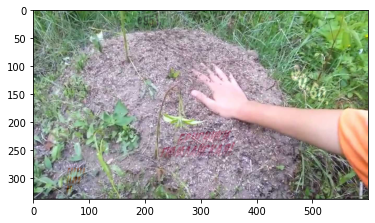

[[[229.19212 204.93494 410.46985 408.66846 296.7375 ]
  [250.52165 283.14148 428.80115 426.9065  394.20514]
  [251.23888 284.52148 427.4347  425.56848 394.42993]
  [229.90935 206.31494 409.1034  407.33044 296.96228]]

 [[221.48177 260.49982 186.1033  221.4012  128.21947]
  [220.8684  255.47789 187.03885 222.45308 127.60954]
  [245.8084  276.96875 213.8139  245.65282 163.53194]
  [246.42177 281.99066 212.87836 244.60094 164.14186]]]
['10.', 'мясной.', 'чм,', '(не', 'Продукт']


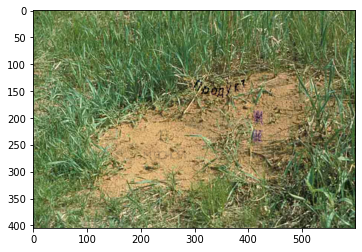

[[[430.26926   445.60513   362.84027   351.25012     4.9587555
     4.651573  301.93527  ]
  [522.9922    536.90015   393.9433    399.68915   136.46259
   147.29044   414.2841   ]
  [522.9883    536.9685    393.37616   399.0027    134.69878
   146.05737   416.22983  ]
  [430.2654    445.67346   362.27313   350.56366     3.1949463
     3.4185257 303.881    ]]

 [[  7.1729107  33.370316  214.70615   243.56966   344.36508
   360.45572   127.03735  ]
  [  7.1923695  33.06665   215.9635    245.44675   357.3176
   371.09433   121.7276   ]
  [ 25.40735    53.604424  229.99298   263.16095   375.22507
   387.62656   162.89731  ]
  [ 25.387892   53.90809   228.73563   261.28387   362.27255
   376.98795   168.20706  ]]]
['этикетки,', 'МОРКОВЬ', 'мате', 'семени;', 'МЕЛКИЙ;', '(битовый', 'пищева)']


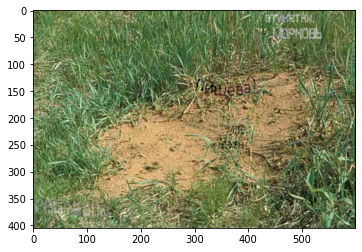

[[[553.322  ]
  [600.73157]
  [593.9252 ]
  [546.5156 ]]

 [[303.53912]
  [318.3308 ]
  [340.14636]
  [325.35468]]]
['Кейк,']


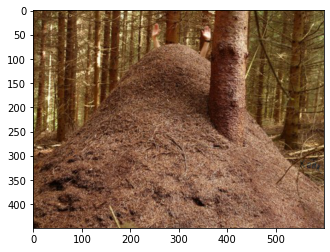

[[[548.4577   213.30318  244.19778  272.54034  275.49814 ]
  [602.1551   325.5667   310.12668  361.61627  330.35007 ]
  [596.61884  334.20502  317.9827   371.08282  329.06253 ]
  [542.92145  221.94147  252.0538   282.0069   274.2106  ]]

 [[304.27032  304.51318  324.9329   350.55823   41.555153]
  [315.21918  260.10687  299.78427  309.5581    44.870167]
  [342.37128  281.94537  320.37943  330.12494   66.17426 ]
  [331.42242  326.35168  345.52805  371.12506   62.85925 ]]]
['МГ/Л', 'Гранола,', 'е421,', 'Семга).', '243,']


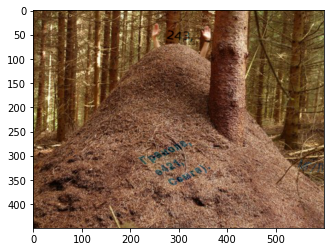

[[[317.1263   310.70462  306.0206   298.5187   293.60376  285.80457
   279.34842  276.00806 ]
  [438.64133  353.4855   390.49643  377.1669   392.70526  386.95294
   325.79483  338.49634 ]
  [432.652    349.52725  385.324    373.23282  387.7915   383.0244
   320.8741   331.3186  ]
  [311.137    306.74637  300.84818  294.58463  288.69     281.87604
   274.4277   268.83032 ]]

 [[ 55.154984  85.51905  114.470085 151.06557  175.98106  212.60173
   237.97302  263.37006 ]
  [ 85.76163   93.99761  131.04367  166.27095  199.13026  231.67146
   247.15808  279.55457 ]
  [109.54045  113.97018  157.40747  186.61958  220.16612  252.50896
   272.04077  307.26788 ]
  [ 78.93381  105.491615 140.8339   171.4142   197.01692  233.43922
   262.8557   291.08337 ]]]
['Эмульгатор,', '225', 'Пектин).', 'мадера,', 'Сиченики,', 'кукуруза,', '319,', 'КЕЙК,']


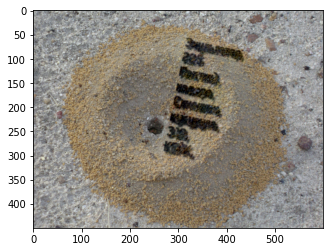

[[[303.58557  297.3963   287.56488  276.7622   265.51474  257.0513
   179.6055   212.02705  160.60535 ]
  [489.6615   456.50043  418.88513  429.51886  424.59244  413.6602
   306.99445  284.69897  291.1061  ]
  [484.5578   447.6994   412.7149   423.51355  418.77927  409.03476
   300.72995  281.1797   286.3755  ]
  [298.48187  288.59528  281.39465  270.7569   259.70157  252.42587
   173.341    208.5078   155.87473 ]]

 [[103.60335  138.28874  183.46198  228.8025   276.7983   330.64886
    46.469822 101.36705  123.06896 ]
  [132.8838   179.08821  208.51053  257.0121   305.97903  358.72693
    71.872215 116.97391  148.31212 ]
  [165.31758  213.40926  240.85876  289.53137  337.6694   384.5257
   103.28769  133.361    172.76825 ]
  [136.03712  172.60979  215.81021  261.32178  308.48868  356.44763
    77.88529  117.754135 147.5251  ]]]
['кулинарной,', '(наружная', '(селенит', 'человека)', 'томатный,', 'цыпленка;', 'буквенные,', 'томат,', 'Белки-82г.']


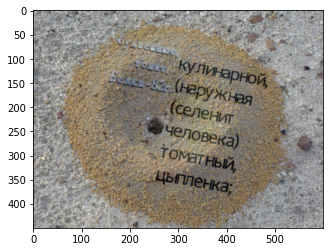

[[[477.0044    451.25714   442.40558   432.11588   421.43738
    77.871445  260.99268   262.04968   264.08047   416.0142
   402.91177   381.02002   364.3424     12.660323   49.482254
    61.239258 ]
  [570.45935   593.1023    558.2303    567.7903    533.5209
   136.21344   290.74872   341.23096   296.31448   558.3285
   479.6121    557.78107   481.33752   124.620415   74.09832
    83.180725 ]
  [571.73804   594.6468    560.0286    569.7235    535.7506
   147.20924   290.65137   341.08856   296.11282   560.3518
   480.08212   558.5732    482.39606   152.91884    84.51021
    93.67749  ]
  [478.28308   452.80164   444.20392   434.04907   423.6671
    88.86725   260.89532   261.9073    263.8788    418.03748
   403.3818    381.81213   365.40094    40.958748   59.894142
    71.73602  ]]

 [[129.27516   151.51152   173.77481   198.33463   221.46082
   391.76886   341.64136   358.4616    373.24414     6.951562
    45.616604   89.95223   130.07504   384.947     414.64874
   438.56284  ]
  [124

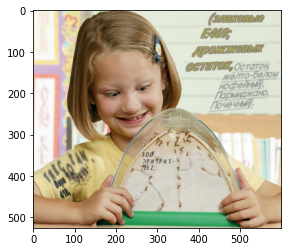

[[[214.27469  217.35948  529.6986   288.25467  175.11246 ]
  [306.93347  309.20453  603.4126   444.5015   264.88986 ]
  [299.94186  301.16382  591.7042   443.9022   257.0332  ]
  [207.28307  209.31877  517.99023  287.65536  167.2558  ]]

 [[100.53713  121.479805 420.82684   10.574091 120.094955]
  [150.7923   171.70566  446.88617   14.984463 166.59581 ]
  [163.6832   186.40924  480.00543   36.215996 181.76439 ]
  [113.42804  136.18338  453.9461    31.805626 135.26353 ]]]
['кора,', 'Е413,', 'Филе-кусок', 'обогащенная,', 'штук,']


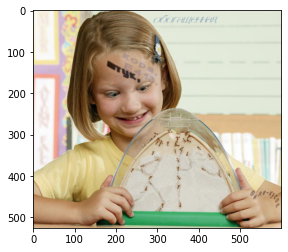

[[[393.7158     390.76834      0.8895732    0.8134966    0.71972597
     0.6192312 ]
  [426.48093    429.22897     40.325233    37.879868    52.670677
    82.736176  ]
  [425.14163    429.20364     43.494884    41.137566    56.034294
    86.21265   ]
  [392.3765     390.743        4.059223     4.0711937    4.0833435
     4.095703  ]]

 [[ 20.630327    53.12522     60.622757    80.41844    100.632095
   120.98222   ]
  [ 22.319664    53.16398     52.811356    72.983765    89.96745
   103.91056   ]
  [ 48.29564     78.32786     68.81325     89.22537    106.35274
   120.63286   ]
  [ 46.6063      78.2891      76.62465     96.66005    117.01738
   137.70453   ]]]
['559,', 'Пять.', 'Уксус,', 'Браво,', 'лучших).', '(СГУЩЕНКА']


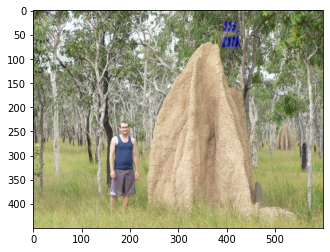

[[[485.9514    31.194078]
  [545.00745   96.14099 ]
  [541.7849    99.548676]
  [482.72885   34.60176 ]]

 [[238.80229  179.42079 ]
  [245.08682  169.16551 ]
  [275.36963  190.74644 ]
  [269.0851   201.00172 ]]]
['ПЭТ,', 'Е473,']


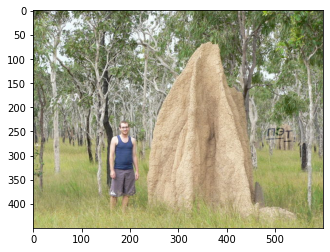

[[[179.21465  127.0002    30.04705  337.73074   36.41831 ]
  [307.83572  178.38106   54.93803  438.38687   89.330956]
  [322.41125  177.58986   73.65491  451.55746   93.24797 ]
  [193.79019  126.209     48.763927 350.90134   40.33532 ]]

 [[114.98855  315.82547  297.79013  130.19537  259.90494 ]
  [ 54.873573 318.61935  284.71494   91.95189  253.46127 ]
  [ 86.059166 333.16965  320.34586  126.61664  285.62625 ]
  [146.17413  330.37576  333.42105  164.86012  292.06992 ]]]
['Однокомпонентный', 'кали,', '62.', '(Богданово', 'пшен']


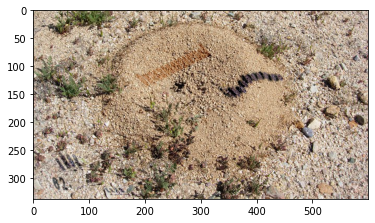

[[[310.88498   -1.154891 339.16208  360.23175  344.52133  167.46048
   195.58571 ]
  [417.21085   89.12891  409.6926   430.20483  450.37912  294.1175
   346.938   ]
  [438.14566  100.26874  422.80875  442.6468   459.3367   308.86166
   359.78247 ]
  [331.8198     9.98494  352.27823  372.6737   353.4789   182.20465
   208.43018 ]]

 [[148.46071  261.5617   166.54552  189.45235  230.37682   74.058
   104.19247 ]
  [ 83.0926   241.76668  127.65651  149.64433  171.89723   17.736681
    41.729225]
  [117.14458  292.5747   151.44441  171.51439  188.1119    50.89377
    72.85215 ]
  [182.5127   312.36975  190.33342  211.3224   246.59148  107.21509
   135.3154  ]]]
['миндальным)', 'слоеные,', '(Винсадском', '(Обжаренная', 'чесночно-сливочный,', 'обезжиренной,', 'Орехово-злаковая,']


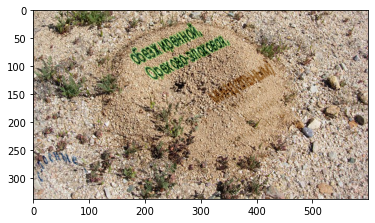

[[[283.03033  105.61329 ]
  [336.0522   169.60373 ]
  [332.59473  169.63583 ]
  [279.57288  105.645386]]

 [[ 13.460813  10.073656]
  [ 20.912006  10.027781]
  [ 45.514843  54.798447]
  [ 38.06365   54.844322]]]
['солода,', 'Грей,']


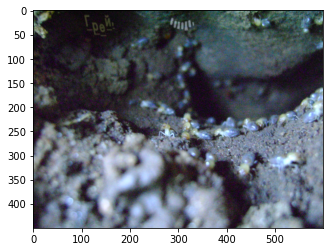

[[[ 49.76992 ]
  [199.2008  ]
  [189.1506  ]
  [ 39.71972 ]]

 [[  9.878297]
  [ 40.86487 ]
  [ 89.331375]
  [ 58.344803]]]
['КУНЖУТНОЕ,']


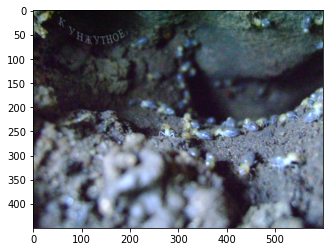

[[[430.09848   436.99524    87.08716     2.3097134 557.6032   ]
  [537.82715   529.9502    192.64713    29.900566  593.39325  ]
  [537.06946   529.7134    190.89728    33.48275   592.75995  ]
  [429.34085   436.75842    85.33731     5.891899  556.9699   ]]

 [[111.5417    132.65814    29.019001   44.705578   55.60949  ]
  [116.29385   133.77155    36.629246   40.514217   56.782524 ]
  [133.46861   153.5444     60.901028   64.095      76.10418  ]
  [128.71646   152.431      53.290783   68.28636    74.931145 ]]]
['гидрированное', 'сицилийский,', '(остром', 'МУКА', 'ДРК.']


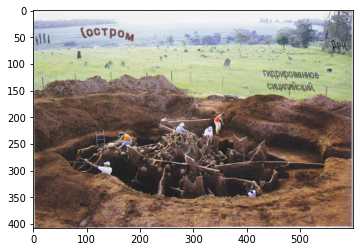

[[[ 81.960686 199.36305 ]
  [175.20026  340.331   ]
  [175.38223  337.43677 ]
  [ 82.14267  196.46883 ]]

 [[ 35.158054  68.61773 ]
  [ 34.61813   82.74024 ]
  [ 66.045715 111.629845]
  [ 66.58563   97.50733 ]]]
['(Хрен', 'заливная,']


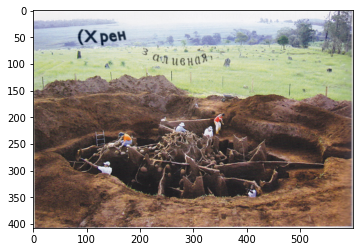

[[[ 35.966297  19.43371   24.713486]
  [128.6678    72.23736  189.16422 ]
  [126.39049   69.46056  189.12366 ]
  [ 33.688984  16.656916  24.672928]]

 [[ 92.95867   78.03454   30.669527]
  [ 98.14087   83.54705   30.89101 ]
  [138.87845  110.14559   61.004814]
  [133.69624  104.63308   60.78333 ]]]
['700-1000,', 'горчиц,', 'миндально-апельсиновый,']


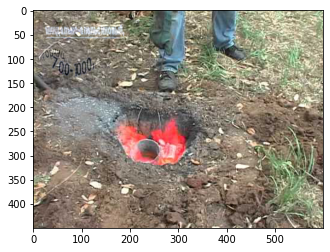

[[[-3.5030365e-02  1.1676057e+01  3.2174559e+00  3.8107917e+00
    4.3404989e+00  4.9662995e+00  5.5059123e+00  6.0465536e+00
    6.5159197e+00  7.1538458e+00  3.5209692e+02  3.5639908e+02
    3.7865582e+02  3.8398697e+02]
  [ 4.4964031e+01  4.4053947e+01  3.6123295e+01  6.7359726e+01
    1.2665430e+02  5.3214321e+01  4.1302437e+01  6.1423660e+01
    2.5781452e+01  6.4320343e+01  4.3608099e+02  4.6032327e+02
    4.5270575e+02  4.7018613e+02]
  [ 4.3797184e+01  4.4370403e+01  3.6808281e+01  6.7980774e+01
    1.2722824e+02  5.3707870e+01  4.1737366e+01  6.1737534e+01
    2.6155197e+01  6.4508392e+01  4.3720691e+02  4.6150046e+02
    4.5241608e+02  4.6915506e+02]
  [-1.2018776e+00  1.1992512e+01  3.9024429e+00  4.4318390e+00
    4.9144440e+00  5.4598503e+00  5.9408417e+00  6.3604279e+00
    6.8896637e+00  7.3418961e+00  3.5322284e+02  3.5757626e+02
    3.7836615e+02  3.8295590e+02]]

 [[ 7.5609961e+00  2.9043266e+01  1.6866983e+02  1.8331805e+02
    1.9755072e+02  2.1524696e+02  2.3027029

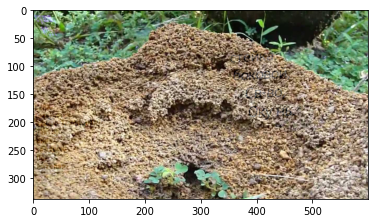

[[[390.84955  396.80365  346.24854   49.657684  93.526306  94.774765]
  [548.0383   515.5543   582.83386  180.38483  161.73398  147.92308 ]
  [549.14764  516.6772   583.31555  180.09894  161.62936  146.901   ]
  [391.95886  397.9265   346.73022   49.371796  93.42169   93.752686]]

 [[183.77478  213.00331  242.14243  149.11868  179.30907  213.6184  ]
  [177.95273  208.70204  238.4944   150.78198  179.59709  216.34334 ]
  [207.90372  239.70305  269.73285  173.25143  204.3701   236.27837 ]
  [213.72577  244.00432  273.38086  171.58813  204.08208  233.55342 ]]]
['МОЛОКО;', '(сфере', 'осьминожки,', 'динатриевая,', '(нария', 'Раст,']


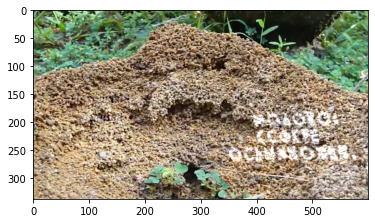

[[[111.90779  100.24037   90.47177   73.48359   60.98726  264.77118
   262.5838  ]
  [183.02626  378.73193  277.21716  216.51126  177.43253  344.7898
   298.17712 ]
  [182.04637  377.92883  276.5828   216.23636  177.24107  343.20068
   292.48688 ]
  [110.9279    99.43724   89.8374    73.20869   60.795807 263.18207
   256.89355 ]]

 [[203.92531  238.10147  274.3628   312.7721   353.5695   313.57785
   344.37357 ]
  [206.44072  246.12424  278.45044  313.97003  354.36765  318.1168
   351.08664 ]
  [234.145    274.00253  307.4317   346.79364  382.30002  346.13156
   381.25693 ]
  [231.6296   265.97977  303.34406  345.5957   381.50186  341.59262
   374.54385 ]]]
['(Вива', 'глюкозно-фруктозный);', 'тазобедренный,', '(Цыпленок', 'МАСАЛА.', '(глубокой', '(ром']


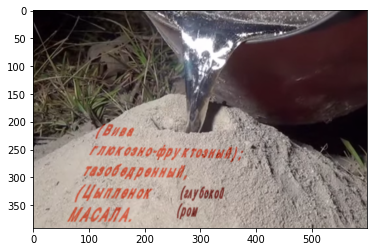

[[[173.88324   164.17747   155.45      327.61633   325.8517
   114.43423    53.137318   40.229473   25.72683     8.025635 ]
  [275.68042   269.424     267.70312   375.68634   358.1553
   140.08328   142.29744   159.82181   140.64365    59.02849  ]
  [274.85568   268.80194   267.30682   375.10248   354.42886
   144.99396   141.46701   160.15938   140.11072    58.755905 ]
  [173.0585    163.55544   155.05373   327.03247   322.12527
   119.34491    52.30689    40.567047   25.193916    7.7530518]]

 [[274.7691    305.05948   340.00113   286.48495   317.79886
   185.17274   229.89029   269.97662   302.80212   343.4292   ]
  [277.02515   306.77554   341.07645   287.47104   321.6312
   175.9517    232.57373   268.50677   304.67578   343.87177  ]
  [314.23914   344.9247    382.44492   315.93393   353.04166
   189.61119   260.16568   295.97284   337.3606    375.28528  ]
  [311.9831    343.20865   381.3696    314.94785   349.20932
   198.83223   257.48224   297.4427    335.48694   374.8427   ]]]

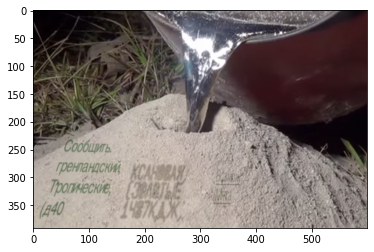

[[[314.72906]
  [392.15997]
  [401.72748]
  [324.29657]]

 [[222.10194]
  [194.50963]
  [221.3585 ]
  [248.95082]]]
['Вкусы']


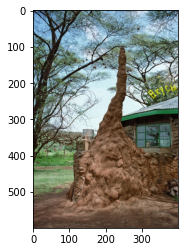

[[[365.5331   357.48666 ]
  [386.60556  395.79117 ]
  [386.69107  395.54477 ]
  [365.61862  357.24026 ]]

 [[ 36.064934  55.395775]
  [ 35.959396  55.98622 ]
  [ 53.035652  71.969284]
  [ 53.14119   71.37884 ]]]
['цб;', 'Е252)']


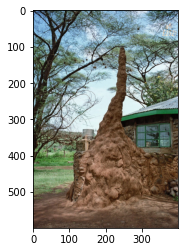

[[[313.03238 206.30989 231.20891]
  [369.57516 236.11067 275.77332]
  [370.23477 236.83516 275.09558]
  [313.692   207.03438 230.5312 ]]

 [[156.15381 153.1227  134.86919]
  [154.79706 152.01234 136.23824]
  [182.28568 171.45708 158.2982 ]
  [183.64243 172.56743 156.92915]]]
['(ПАВ', '17.', 'Бузы,']


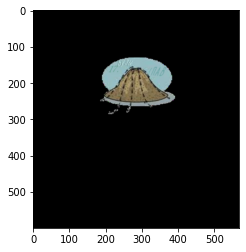

In [ ]:
# im_n = 0
# im_name_label = []

# for item in tqdm.tqdm_notebook(list(range(len(dsets)))[0:len_train_images]):
    
#     k = dsets[item]
    
#     rgb = db['data'][k][...]
#     wordBB = db['data'][k].attrs['wordBB']
#     txt = db['data'][k].attrs['txt']
#     txt = [prepare_text(i.decode('utf-8')).split(' ') for i in txt]
#     txt = list(itertools.chain(*txt))
#     print(wordBB)

#     plt.imshow(rgb)
#     print(txt)
#     plt.show()

### Дообучение модели детекции **PaddleOCR**

##### 1. Установка библиотек и клонирование репозитория **PaddleOCR**

In [3]:
!pip install paddlepaddle-gpu==2.3.0.post110 -f https://www.paddlepaddle.org.cn/whl/linux/mkl/avx/stable.html

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in links: https://www.paddlepaddle.org.cn/whl/linux/mkl/avx/stable.html
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 532.9/532.9 MB 2.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 374.0/374.0 KB 4.4 MB/s eta 0:00:00


In [4]:
!pip install "paddleocr>=2.0.1"

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 445.9/445.9 KB 4.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.9/8.9 MB 57.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.6/5.6 MB 75.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.1/67.1 MB 12.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.3/6.3 MB 60.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 148.4/148.4 KB 10.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.9/60.9 MB 11.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 32.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 305.9/305.9 KB 19.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 608.2/608.2 KB 38.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 88.3/88.3 KB

In [5]:
!pip install tornado==6.0.4

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 496.2/496.2 KB 5.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for tornado: filename=tornado-6.0.4-cp39-cp39-linux_x86_64.whl size=427774 sha256=aac481f44719e168dcf76d9097c04ff133aadc60128ad1a65e1c9760691a7f7a
  Stored in directory: /root/.cache/pip/wheels/6f/ef/c9/5a028b736b28e21d3cad611317376ff57e17e4f6d2b6bc6a51
Successfully built tornado
  Attempting uninstall: tornado
    Found existing installation: tornado 6.2
    Uninstalling tornado-6.2:
      Successfully uninstalled tornado-6.2
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
terminado 0.17.1 requires tornado>=6.1.0, but you have tornado 6.0.4 which is incompatible.
notebook 6.3.0 requires tornado>=6.1, but you have tornado 6.0.4 

In [6]:
os.chdir('/content/')
!git clone https://github.com/PaddlePaddle/PaddleOCR

Cloning into 'PaddleOCR'...
remote: Enumerating objects: 46135, done.
remote: Counting objects: 100% (5/5), done.
remote: Compressing objects: 100% (5/5), done.
remote: Total 46135 (delta 0), reused 2 (delta 0), pack-reused 46130
Receiving objects: 100% (46135/46135), 339.18 MiB | 19.51 MiB/s, done.
Resolving deltas: 100% (32445/32445), done.
Updating files: 100% (1620/1620), done.


In [7]:
!pip3 install -r /content/PaddleOCR/requirements.txt

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Preparing metadata (setup.py) ... done
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for lanms-neo: filename=lanms_neo-1.0.2-cp39-cp39-linux_x86_64.whl size=115799 sha256=14c71297750254e9bd4d2e22f9bb5d32856920beb3e4bfe3c0ea76fc195bb7af
  Stored in directory: /root/.cache/pip/wheels/fc/fa/0e/be0bc6aae3a61c51b12ec7ef7dc76b0a4c4c6c61b46d6ef397
  Created wheel for Polygon3: filename=Polygon3-3.0.9.1-cp39-cp39-linux_x86_64.whl size=118178 sha256=0603b51851955ae3b048b4615b9bc85efa67a3b0197d9c9cba6a05fc595cbec5
  Stored in directory: /root/.cache/pip/wheels/d8/37/5c/65e438d5ec32cf193fd8ccdfb261a9c53d2ae24c56704cbedb
Successfully built lanms-neo Polygon3


##### 2. Подготовка данных, необходимых для дообучения модели

Создаем папку *train_data_detection* подгружаем и распаковываем архив с вырезанными изображениями *scene_text_recognition.zip*.

In [ ]:
with ZipFile('/content/gdrive/MyDrive/1_SynthText/scene_text_recognition.zip', 'r') as f:
  f.extractall('/content/PaddleOCR/train_data_detection/')

Загрузили предобученную модель `“rec_svtr_tiny_none_ctc_en”` с [этой страницы](https://github.com/PaddlePaddle/PaddleOCR/blob/release/2.6/doc/doc_en/algorithm_overview_en.md), разархивировали и переместили ее в /PaddleOCR/pretrain_models.

In [8]:
!wget -P /content/PaddleOCR/pretrain_models/ https://paddleocr.bj.bcebos.com/PP-OCRv3/chinese/rec_svtr_tiny_none_ctc_en_train.tar
file = tarfile.open('/content/PaddleOCR/pretrain_models/rec_svtr_tiny_none_ctc_en_train.tar')
file.extractall('/content/PaddleOCR/pretrain_models')
file.close()

--2023-03-30 21:57:16--  https://paddleocr.bj.bcebos.com/PP-OCRv3/chinese/rec_svtr_tiny_none_ctc_en_train.tar
Resolving paddleocr.bj.bcebos.com (paddleocr.bj.bcebos.com)... 103.235.46.61, 2409:8c04:1001:1002:0:ff:b001:368a
Connecting to paddleocr.bj.bcebos.com (paddleocr.bj.bcebos.com)|103.235.46.61|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 24135680 (23M) [application/x-tar]
Saving to: ‘/content/PaddleOCR/pretrain_models/rec_svtr_tiny_none_ctc_en_train.tar’

rec_svtr_tiny_none_ 100%[===================>]  23.02M  6.15MB/s    in 19s     

2023-03-30 21:57:38 (1.23 MB/s) - ‘/content/PaddleOCR/pretrain_models/rec_svtr_tiny_none_ctc_en_train.tar’ saved [24135680/24135680]



Добавили список символов и русский алфавит в файл /ppocr/utils/dict/rus_chars.txt. 

In [ ]:
!cp '/content/gdrive/MyDrive/2_PaddleOCR_det/rus_chars.txt' '/content/PaddleOCR/ppocr/utils/dict'

##### 3. Дообучение модели CVTR-Tiny

Запустили тренировку модели с [конфигурацией](https://github.com/datanomica/Convert-SynthText-to-PaddleOCR-format-Train-SVTR/blob/main/rec_svtrnet_habr.yml) `rec_svtrnet_habr.yml`, которую поместили в /configs/rec.

In [ ]:
!cp "/content/gdrive/MyDrive/2_PaddleOCR_det/rec_svtrnet_habr.yml" "/content/PaddleOCR/configs/rec"

In [ ]:
os.chdir('/content/PaddleOCR/')
!python3 tools/train.py -c configs/rec/rec_svtrnet_habr.yml -o Global.pretrained_model=./pretrain_models/rec_svtr_tiny_none_ctc_en_train_/best_accuracy

/usr/local/lib/python3.9/dist-packages/pkg_resources/__init__.py:121: DeprecationWarning: pkg_resources is deprecated as an API
  warnings.warn("pkg_resources is deprecated as an API", DeprecationWarning)
/usr/local/lib/python3.9/dist-packages/pkg_resources/__init__.py:2870: DeprecationWarning: Deprecated call to `pkg_resources.declare_namespace('google')`.
Implementing implicit namespace packages (as specified in PEP 420) is preferred to `pkg_resources.declare_namespace`. See https://setuptools.pypa.io/en/latest/references/keywords.html#keyword-namespace-packages
  declare_namespace(pkg)
/usr/local/lib/python3.9/dist-packages/pkg_resources/__init__.py:2870: DeprecationWarning: Deprecated call to `pkg_resources.declare_namespace('google.cloud')`.
Implementing implicit namespace packages (as specified in PEP 420) is preferred to `pkg_resources.declare_namespace`. See https://setuptools.pypa.io/en/latest/references/keywords.html#keyword-namespace-packages
  declare_namespace(pkg)
/usr/lo

Экспортируем дообученную модель

In [ ]:
os.chdir('/content/PaddleOCR/')
!python3 tools/export_model.py -c configs/rec/rec_svtrnet_habr.yml -o  Global.pretrained_model=./output/svtr_habr/best_accuracy  Global.save_inference_dir=./inference/svtr_habr

/usr/local/lib/python3.9/dist-packages/pkg_resources/__init__.py:121: DeprecationWarning: pkg_resources is deprecated as an API
  warnings.warn("pkg_resources is deprecated as an API", DeprecationWarning)
/usr/local/lib/python3.9/dist-packages/pkg_resources/__init__.py:2870: DeprecationWarning: Deprecated call to `pkg_resources.declare_namespace('google')`.
Implementing implicit namespace packages (as specified in PEP 420) is preferred to `pkg_resources.declare_namespace`. See https://setuptools.pypa.io/en/latest/references/keywords.html#keyword-namespace-packages
  declare_namespace(pkg)
/usr/local/lib/python3.9/dist-packages/pkg_resources/__init__.py:2870: DeprecationWarning: Deprecated call to `pkg_resources.declare_namespace('google.cloud')`.
Implementing implicit namespace packages (as specified in PEP 420) is preferred to `pkg_resources.declare_namespace`. See https://setuptools.pypa.io/en/latest/references/keywords.html#keyword-namespace-packages
  declare_namespace(pkg)
/usr/lo